In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import tensorflow as tf
from tensorflow.keras.models import Model
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_curve, mean_squared_error
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models, Sequential
import os
from sklearn.utils import shuffle
from tensorflow.keras.models import load_model
from tqdm import tqdm
import gc

# 1. Developing a machine learning algorithm that is capable of classifying whether a particular class of terrain is anywhere in the image -- this is a binary classification for each class.

In [ ]:
#read in data from google drive
from google.colab import drive
drive.mount('/content/drive')
! unzip /content/drive/MyDrive/train/images.zip

Mounted at /content/drive
Archive:  /content/drive/MyDrive/train/images.zip
  inflating: class_dict.csv          
  inflating: metadata.csv            
   creating: train/
  inflating: train/949235_mask.png   
  inflating: train/164029_sat.jpg    
  inflating: train/439854_mask.png   
  inflating: train/534154_sat.jpg    
  inflating: train/200561_mask.png   
  inflating: train/180902_sat.jpg    
  inflating: train/864488_mask.png   
  inflating: train/276761_mask.png   
  inflating: train/266_mask.png      
  inflating: train/78430_mask.png    
  inflating: train/983603_mask.png   
  inflating: train/950926_mask.png   
  inflating: train/78298_mask.png    
  inflating: train/15573_mask.png    
  inflating: train/927126_sat.jpg    
  inflating: train/628479_mask.png   
  inflating: train/442329_mask.png   
  inflating: train/678520_mask.png   
  inflating: train/185562_sat.jpg    
  inflating: train/707319_mask.png   
  inflating: train/479682_sat.jpg    
  inflating: train/95683_sat.j

In [ ]:
meta = pd.read_csv("metadata.csv").dropna().reset_index(drop=True)
classes = pd.read_csv("class_dict.csv")
rgb = classes[['r', 'g', 'b']].values
print(classes)
print(meta)

               name    r    g    b
0        urban_land    0  255  255
1  agriculture_land  255  255    0
2         rangeland  255    0  255
3       forest_land    0  255    0
4             water    0    0  255
5       barren_land  255  255  255
6           unknown    0    0    0
     image_id  split        sat_image_path              mask_path
0      100694  train  train/100694_sat.jpg  train/100694_mask.png
1      102122  train  train/102122_sat.jpg  train/102122_mask.png
2       10233  train   train/10233_sat.jpg   train/10233_mask.png
3      103665  train  train/103665_sat.jpg  train/103665_mask.png
4      103730  train  train/103730_sat.jpg  train/103730_mask.png
..        ...    ...                   ...                    ...
798    992507  train  train/992507_sat.jpg  train/992507_mask.png
799    994520  train  train/994520_sat.jpg  train/994520_mask.png
800    995492  train  train/995492_sat.jpg  train/995492_mask.png
801    997521  train  train/997521_sat.jpg  train/997521_mas

(2448, 2448, 3)


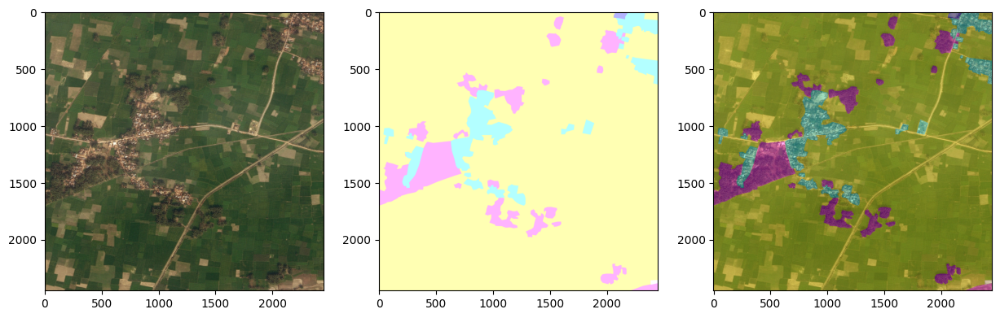

In [ ]:
#in this cell we will plot a single test image from the training dataset and its associated mask
whichImg=56
im=imageio.imread(meta['sat_image_path'][whichImg]) #Read in the sat image
mask=imageio.imread(meta['mask_path'][whichImg]) #Read in the mask

print(np.shape(im))

#three plots: satellite, mask, mask+satellite
fig,ax = plt.subplots(1,3,figsize=(15, 15))
ax[0].imshow(im)
ax[1].imshow(mask,alpha=0.3) #alpha=0.3 to make the mask transparent
ax[2].imshow(im)
ax[2].imshow(mask,alpha=0.3) #alpha=0.3 to make the mask transparent

## Creating binary labels for train images

In [ ]:
def rgb_to_class(mask_rgb, rgb):
  """
  converts a RGB mask into a class index mask
  Input: mask_rgb, the rgb mask
  rgb, the rgb values for each class
  Output: mask_class, the class index mask
  """
  h, w, _ = mask_rgb.shape
  mask_flat = mask_rgb.reshape(-1, 3) #flatten the mask into a 2d array of pixels
  matches = (mask_flat[:, None, :] == rgb[None, :, :]).all(-1) #matching pixels to class colour
  class_indices = matches.argmax(axis=1) #for each pixel get class
  return class_indices.reshape(h, w)

def create_binary_labels(meta, rgb):
  """
  creates a binary label matrix indicating which classes are present in each image
  inputs: meta, the metadata for mask
  rgb, the rgb values for each class
  outputs: labels, the binary label matrix
  """
  labels = np.zeros((len(meta), len(rgb)))  #initialize labels matrix
  for i, row in meta.iterrows():
        mask_rgb = imageio.imread(row['mask_path'])
        mask_class = rgb_to_class(mask_rgb, rgb)
        for j in range(len(rgb)):      #for each class j
            if np.any(mask_class == j):    #check if class j exists
                labels[i, j] = 1  #mark j as present
  return labels

In [ ]:
train_meta = meta.iloc[:803] #first 803 images are train images
#train_labels = create_binary_labels(train_meta, rgb) #corresponding labels
#np.save('/content/drive/MyDrive/train_labels.npy', train_labels)
all_labels = np.load('/content/drive/MyDrive/train_labels.npy')

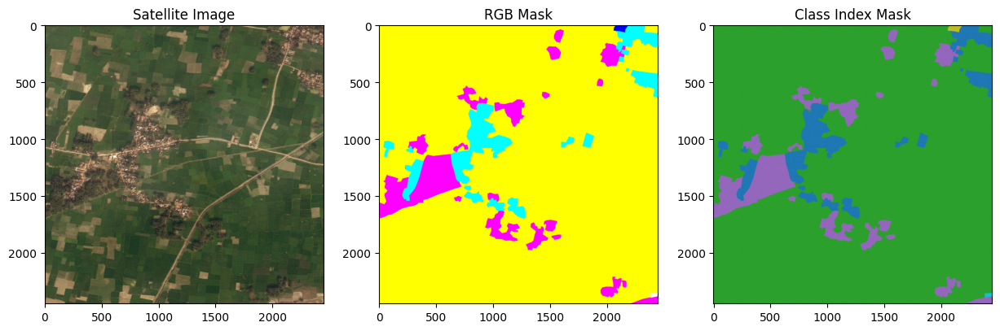

[1. 1. 1. 0. 1. 1. 0.]
CLASS DISTRIBUTION
Number of images per class: [649. 722. 522. 194. 478. 428. 159.]


In [ ]:
whichImg = 56
im = imageio.imread(meta['sat_image_path'][whichImg])
mask_rgb = imageio.imread(meta['mask_path'][whichImg])
mask_class = rgb_to_class(mask_rgb, rgb)

fig, ax = plt.subplots(1, 3, figsize=(15, 15))
ax[0].imshow(im)
ax[0].set_title('Satellite Image')

ax[1].imshow(mask_rgb)
ax[1].set_title('RGB Mask')

ax[2].imshow(mask_class, cmap='tab10')
ax[2].set_title('Class Index Mask')
plt.show()

#print to test
print(all_labels[whichImg])
#print("Labels shape:", labels.shape)
print("CLASS DISTRIBUTION")
print("Number of images per class:", np.sum(all_labels, axis=0))

##Model evaluation

each model tested will be evaluated using the following functions

In [ ]:
def get_image_tiles_and_labels(image_path, mask_path, rgb, tile_size=256):
  """
  Splits an image and mask into tiles and computes binary multi-labels for each tile
  inputs: image_path, path to the image
  mask_path, path to the mask
  rgb, the rgb values for each class
  tile_size, the size of each tile
  outputs: tiles, the image tiles
  labels, the binary labels for each tile
  """
  image = imageio.imread(image_path)
  mask_rgb = imageio.imread(mask_path)

  mask_class = rgb_to_class(mask_rgb, rgb)

  tiles = []
  labels = []

  h, w, _ = image.shape
  for y in range(0, h - tile_size + 1, tile_size): #vertical loop
      for x in range(0, w - tile_size + 1, tile_size): #horizontal loop
          tile = image[y:y+tile_size, x:x+tile_size] #crop out tile
          tile_mask = mask_class[y:y+tile_size, x:x+tile_size]  #crop mask

          if tile.shape != (tile_size, tile_size, 3): #ensure tile is correct shape
              continue  # skip malformed tiles eg at edges

          label = np.array([1 if np.any(tile_mask == c) else 0 for c in range(len(rgb))])
          tiles.append(tile / 255.0) #normalise
          labels.append(label)

  return np.array(tiles).astype(np.float32), np.array(labels).astype(np.float32)

In [ ]:
def evaluate_model(model, val_meta, rgb, thresholds=None):
  """"
  Evaluates a mulit label classification model on tiled satelite images.
  input: model, trained model
  val_meta, metadata for validation images
  rgb, rgb values for each class
  thresholds, thresholds to use for classification
  output: prints classification report and correctness score

  """
  if thresholds is None:
      thresholds = np.array([0.5] * len(rgb)) #default threshold 0.5

  y_true, y_pred = [], []
  total_correct = 0
  total_labels = 0
  per_class_correct = np.zeros(len(rgb))
  per_class_total = np.zeros(len(rgb))

  for i in range(len(val_meta)):
    image_path = val_meta.iloc[i]['sat_image_path']
    mask_path = val_meta.iloc[i]['mask_path']

    image = imageio.imread(image_path)
    mask = imageio.imread(mask_path)
    mask_class = rgb_to_class(mask, rgb)

    tiles_img, _ = tile_image_and_mask(image, mask_class)

    # Predict on tiles and reduce to single label per image
    preds = model.predict(np.array(tiles_img, dtype=np.float32) / 255.0, verbose=0) #noramlising input
    image_pred = (np.max(preds, axis=0) > thresholds).astype(int) #class presence

    # True labels for this image
    label = [1 if np.any(mask_class == c) else 0 for c in range(len(rgb))]

    y_true.append(label)
    y_pred.append(image_pred)

    # per class match
    for idx in range(len(rgb)):
      per_class_total[idx] += 1
      if label[idx] == image_pred[idx]:
        per_class_correct[idx] += 1

    #total corectness
    total_correct += sum([int(t == p) for t, p in zip(label, image_pred)])
    total_labels += len(rgb)

    # example predictions
    if i < 5:
      plt.figure(figsize=(5, 2))
      plt.imshow(image)
      plt.title(f"true: {label} | pred: {image_pred}")
      plt.axis("off")
      plt.show()

  print("Classification Report:")
  print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))

  print("Percentage of each class correctly identified (when present):")
  for idx, name in enumerate(class_names):
    correct = sum((t[idx] == p[idx] == 1) for t, p in zip(y_true, y_pred)) #true positive
    total = sum(t[idx] == 1 for t in y_true)  #class was present
    if total > 0:
      print(f"{name:20}: {100 * correct / total:.1f}%")  #for only img that contain class


  overall_score = total_correct / total_labels
  print(f"Overall label-wise correctness score: {overall_score:.3f} ({overall_score * 100:.1f}%)\n")

  print("Correctness per class label:")
  for idx, name in enumerate(class_names):
    score = per_class_correct[idx] / per_class_total[idx]
    print(f"{name:20}: {score:.3f} ({score * 100:.1f}%)")





In [ ]:
def evaluate_loss(model, test_images, test_masks):
  """
  evaluates model on test data and plots loss and accuracy against epoch
  input: model, trained model
  test_images, test images
  test_masks, test masks
  output: plots loss and accuracy against epoch
  """
  loss, accuracy = model.evaluate(test_images, test_masks)
  print(f"Test Loss: {loss:.4f}")
  print(f"Test Accuracy: {accuracy:.4f}")
  plt.plot(history.history['accuracy'], label='Train Accuracy')
  plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
  plt.title('Model Accuracy Over Epochs')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.grid()
  plt.show()
  plt.plot(history.history['loss'], label='Train Loss')
  plt.plot(history.history['val_loss'], label='Validation Loss')
  plt.title('Model Loss Over Epochs')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()
  plt.grid()
  plt.show()

## Model 1: CNN model for binary classification

In [ ]:
tile_size=256
step_size=256
num_classes = len(rgb)
class_names = ["Urban", "Agriculture", "Rangeland", "Forest", "Water", "Barren", "Unknown"]
input_shape = (256, 256, 3)

In [ ]:
#using sliding window method to turn image into smaller tiles for training
def tile_image_and_mask(img, mask, tile_size=256):
  """
  splits a large image and mask into smaller tiles
  input: img, satelite image
  mask, class index mask
  tile_size, size of each tile
  output:
  tiles_img, array of image tiles
  tiles_mask, array of corresponding mask tiles
  """
  tiles_img, tiles_mask = [], []
  for y in range(0, img.shape[0] - tile_size + 1, tile_size):   #move window y direction
    for x in range(0, img.shape[1] - tile_size + 1, tile_size):   #move window x direction
      tile = img[y:y+tile_size, x:x+tile_size]  #cutting out image tile
      tile_mask = mask[y:y+tile_size, x:x+tile_size]  #cutting out mask tile
      if tile.shape[:2] == (tile_size, tile_size):  #removing tiles that arn't tile size as they dont fit in cnn
        tiles_img.append(tile)
        tiles_mask.append(tile_mask)
  return np.array(tiles_img), np.array(tiles_mask)

In [ ]:
def build_cnn_model(input_shape=(256, 256, 3), num_classes=7):
  """
  builds a cnn network to classify terain present in image
  input: input_shape, shape of input image (tile)
  num_classes, number of terrain classes to classify between
  output: model, complied cnn model ready to train
  """
  model = models.Sequential([
      layers.Input(shape=input_shape),
      layers.Rescaling(1./255),   #normalising pixel values from 0-255 to 0-1
      layers.Conv2D(32, 3, activation='relu'),  #for basic features
      layers.MaxPooling2D(),  #taking max values, keeping just the strongest features
      layers.Conv2D(64, 3, activation='relu'),
      layers.MaxPooling2D(),
      layers.Conv2D(128, 3, activation='relu'),   #for details
      layers.GlobalAveragePooling2D(),  #extracting value whether terrain exists or not
      layers.Dense(64, activation='relu'),
      layers.Dense(num_classes, activation='sigmoid')
  ])
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=[tf.keras.metrics.AUC(multi_label=True)])
  return model

In [ ]:
def train_model1(meta, rgb, model, tile_size=256, epochs_per_image=1, batch_size=32):
  """function that trains the cnn image by image to save RAM by not having to create all tiles and masks at once
  input: meta, image and mask meta data paths
  rgb, list of rgb values for each class
  model, cnn model
  tile_size, size of each tile
  epochs_per_image, number of epochs to train on each image
  batch_size, batch size for training
  output: model, trained cnn model
  """
  for i, row in meta.iterrows():  #looping over each img
    image = imageio.imread(row['sat_image_path'])
    mask_rgb = imageio.imread(row['mask_path'])
    mask_class = rgb_to_class(mask_rgb, rgb)

    train_tiles, tile_masks = tile_image_and_mask(image, mask_class, tile_size)   #creating tiles from image and mask
    tile_labels = []

    for tile_mask in tile_masks:
      label = [1 if np.any(tile_mask == c) else 0 for c in range(len(rgb))]   #checking which classes are in the array
      tile_labels.append(label)

    train_tiles = np.array(train_tiles, dtype=np.float32)
    tile_labels = np.array(tile_labels, dtype=np.float32)

    model.fit(train_tiles, tile_labels, epochs=epochs_per_image, batch_size=batch_size, verbose=1)

  return model

In [ ]:
train_subset = train_meta.iloc[:500].reset_index(drop=True)

#model1 = build_cnn_model(input_shape=(256, 256, 3), num_classes=len(rgb))
#model1 = train_model1(train_subset, rgb, model1)

model1 = load_model("/content/drive/MyDrive/model1_cnn.keras")

In [ ]:
#model1.save("/content/drive/MyDrive/model1_cnn.keras")

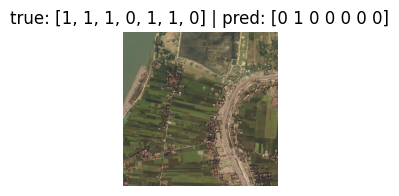

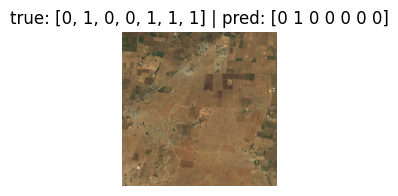

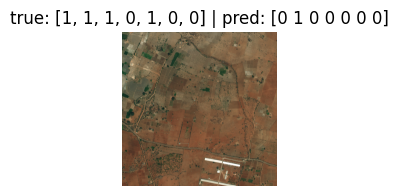

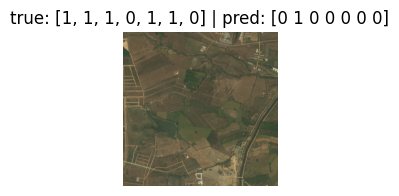

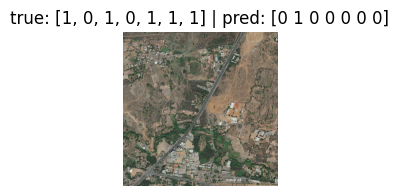

Classification Report:
              precision    recall  f1-score   support

       Urban       0.00      0.00      0.00         7
 Agriculture       0.90      1.00      0.95         9
   Rangeland       0.00      0.00      0.00         7
      Forest       0.00      0.00      0.00         2
       Water       0.00      0.00      0.00         8
      Barren       0.00      0.00      0.00         6
     Unknown       0.00      0.00      0.00         5

   micro avg       0.90      0.20      0.33        44
   macro avg       0.13      0.14      0.14        44
weighted avg       0.18      0.20      0.19        44
 samples avg       0.90      0.21      0.34        44

Percentage of each class correctly identified (when present):
Urban               : 0.0%
Agriculture         : 100.0%
Rangeland           : 0.0%
Forest              : 0.0%
Water               : 0.0%
Barren              : 0.0%
Unknown             : 0.0%
Overall label-wise correctness score: 0.486 (48.6%)

Correctness per clas

In [ ]:
val_meta = meta.iloc[793:803].reset_index(drop=True)
evaluate_model(model1, val_meta, rgb, thresholds=None)

## Model 2: Adjusting thresholds to improve model predictions and augmenting data for better learning of rare classes

In [ ]:
def find_best_threshold(true_label, pred_label):
  """
  finds optimal class threshold by maximising F1 score

  """
  thresholds = []
  for i in range(true_label.shape[1]):
    precision, recall, thresh = precision_recall_curve(true_label[:, i], pred_label[:, i]) #precision recall curve
    f1 = 2 * (precision * recall) / (precision + recall + 1e-7)  #f1 score for each threshold
    best = thresh[np.argmax(f1[:-1])] #max f1
    thresholds.append(best)
  return thresholds


In [ ]:
#calculating best thresholds
all_probs = []
all_true = []
for i in range(len(val_meta)):
  image_path = val_meta.iloc[i]['sat_image_path']
  mask_path = val_meta.iloc[i]['mask_path']

  image = imageio.imread(image_path)
  tiles, _ = tile_image_and_mask(image, np.zeros_like(image[:, :, 0]))  # dummy mask
  tile_images = np.array(tiles, dtype=np.float32) / 255.0
  probs = model1.predict(tile_images, verbose=0).max(axis=0)  # take max prob. per class

  true = all_labels[i]

  all_probs.append(probs)
  all_true.append(true)

all_probs = np.array(all_probs)
all_true = np.array(all_true)

best_thresholds = find_best_threshold(all_true, all_probs)
print("Best thresholds per class:", best_thresholds)

Best thresholds per class: [np.float32(0.3109248), np.float32(0.69263315), np.float32(0.28687966), np.float32(0.20936781), np.float32(0.23345032), np.float32(0.24689293), np.float32(0.056931738)]


In [ ]:
thresholds = [0.3109248, 0.69263315, 0.28687966, 0.20936781, 0.23345032, 0.24689293, 0.056931738]
rare_classes=[0, 2,3, 4,5, 6]

In [ ]:
def train_on_images_class_aware(meta, rgb, model, tile_size=256, epochs_per_image=1, batch_size=32, rare_classes=rare_classes, boost_factor=3):
    """
    trains the CNN model with oversampling for tiles containing rare classes
    input: meta, image and mask meta data paths
    rgb, list of rgb values for each class
    model, cnn model
    tile_size, size of each tile
    epochs_per_image, number of epochs to train on each
    output, model, trained cnn model
    """
    for i, row in meta.iterrows():
        image = imageio.imread(row['sat_image_path'])
        mask_rgb = imageio.imread(row['mask_path'])
        mask_class = rgb_to_class(mask_rgb, rgb)

        tiles_img, tiles_mask = tile_image_and_mask(image, mask_class, tile_size)

        train_tiles = []
        tile_labels = []

        for tile, tile_mask in zip(tiles_img, tiles_mask):
            label = [1 if np.any(tile_mask == c) else 0 for c in range(len(rgb))]
            #oversample based on rare class presence
            weight = boost_factor if any(label[c] for c in rare_classes) else 1
            #add tile 'weight' times
            for _ in range(weight):
                train_tiles.append(tile)
                tile_labels.append(label)

        train_tiles = np.array(train_tiles, dtype=np.float32)
        tile_labels = np.array(tile_labels, dtype=np.float32)

        #shuffling training data for improved learning
        train_tiles, tile_labels = shuffle(train_tiles, tile_labels, random_state=42)

        history = model.fit(train_tiles, tile_labels, epochs=epochs_per_image, batch_size=batch_size, verbose=1)

    return model

In [ ]:
model2 = build_cnn_model(input_shape=(256, 256, 3), num_classes=len(rgb))
#model2 = train_on_images_class_aware(train_subset, rgb, model2, rare_classes=[0, 2, 3, 4,5, 6], boost_factor=5)
model2 = load_model("/content/drive/MyDrive/model2_cnn.keras")

In [ ]:
#model2.save("/content/drive/MyDrive/model2_cnn.keras")

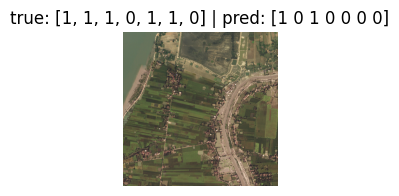

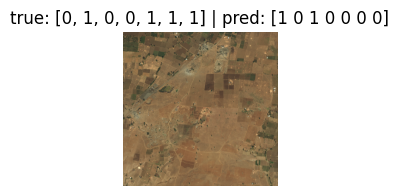

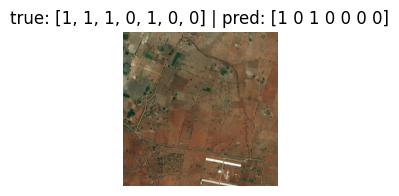

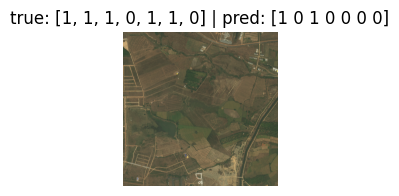

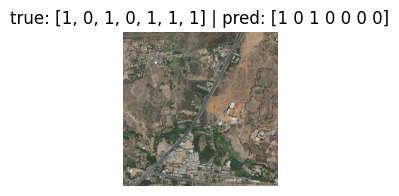

Classification Report:
              precision    recall  f1-score   support

       Urban       0.70      1.00      0.82         7
 Agriculture       0.00      0.00      0.00         9
   Rangeland       0.70      1.00      0.82         7
      Forest       0.00      0.00      0.00         2
       Water       0.00      0.00      0.00         8
      Barren       0.00      0.00      0.00         6
     Unknown       0.00      0.00      0.00         5

   micro avg       0.70      0.32      0.44        44
   macro avg       0.20      0.29      0.24        44
weighted avg       0.22      0.32      0.26        44
 samples avg       0.70      0.30      0.42        44

Percentage of each class correctly identified (when present):
Urban               : 100.0%
Agriculture         : 0.0%
Rangeland           : 100.0%
Forest              : 0.0%
Water               : 0.0%
Barren              : 0.0%
Unknown             : 0.0%
Overall label-wise correctness score: 0.486 (48.6%)

Correctness per cl

In [ ]:
val_meta = meta.iloc[793:803].reset_index(drop=True)
evaluate_model(model2, val_meta, rgb, thresholds=thresholds)

Adjusting the thresholds to invesigate effect on predicted labels

[0.2609248  0.64263315 0.23687966 0.15936781 0.18345032 0.19689293
 0.00693174]


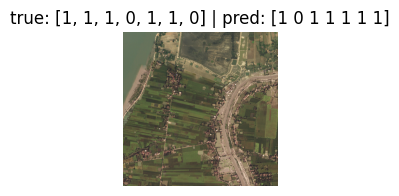

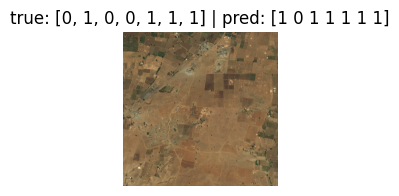

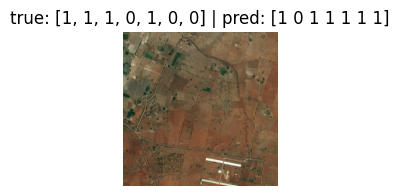

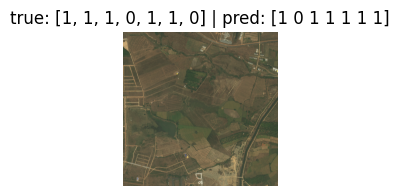

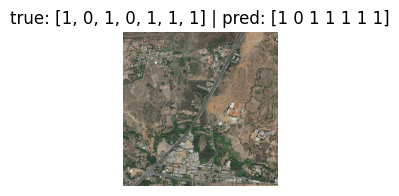

Classification Report:
              precision    recall  f1-score   support

       Urban       0.70      1.00      0.82         7
 Agriculture       0.00      0.00      0.00         9
   Rangeland       0.70      1.00      0.82         7
      Forest       0.20      1.00      0.33         2
       Water       0.80      1.00      0.89         8
      Barren       0.60      1.00      0.75         6
     Unknown       0.50      1.00      0.67         5

   micro avg       0.58      0.80      0.67        44
   macro avg       0.50      0.86      0.61        44
weighted avg       0.52      0.80      0.62        44
 samples avg       0.58      0.79      0.67        44

Percentage of each class correctly identified (when present):
Urban               : 100.0%
Agriculture         : 0.0%
Rangeland           : 100.0%
Forest              : 100.0%
Water               : 100.0%
Barren              : 100.0%
Unknown             : 100.0%
Overall label-wise correctness score: 0.514 (51.4%)

Correctnes

In [ ]:
thresholds = np.array([0.3109248, 0.69263315, 0.28687966, 0.20936781, 0.23345032, 0.24689293, 0.056931738])
thresholds -= 0.05
print(thresholds)
evaluate_model(model2, val_meta, rgb, thresholds=thresholds)

Adjusting the thresholds changes the labels, howver the predicted label is still the same for each image, suggesting a fundamental probelm with the model or data preparation itself.

 ## Model 3: training our model using the MobileNetV2 pretrained encoder

We will levarage the pretrained model MobileNetV2 to improve the accuracy of the labels.

**Creating and saving tiles**

To speed up the training process 256x256 tiles are used instead of full 2448x2448 images. These are created and saved to google drive here to avoid having to re calculate every time the model is trained. The tiles are created by sliding a 256x256 window over each image and its corresponding mask.

In [ ]:
cache_meta = "/content/drive/MyDrive/tile_cache"

# Load or Create Tiles
os.makedirs(cache_meta, exist_ok=True)
tiles = []
tiles_labels = []

for _, row in meta.iterrows():
    base = os.path.splitext(os.path.basename(row['sat_image_path']))[0]
    tile_path = os.path.join(cache_meta, f"{base}_tiles.npy")
    label_path = os.path.join(cache_meta, f"{base}_labels.npy")

    if not os.path.exists(tile_path) or not os.path.exists(label_path):
        print(f"caching tiles for: {base}")
        tiles, labels = get_image_tiles_and_labels(row['sat_image_path'], row['mask_path'], rgb)
        np.save(tile_path, tiles)
        np.save(label_path, labels)
    else:
        print(f"already cached: {base}")

already cached: 100694_sat
already cached: 102122_sat
already cached: 10233_sat
already cached: 103665_sat
already cached: 103730_sat
already cached: 104113_sat
already cached: 10452_sat
already cached: 10901_sat
already cached: 111335_sat
already cached: 114433_sat
already cached: 114473_sat
already cached: 114577_sat
already cached: 115444_sat
already cached: 119012_sat
already cached: 119079_sat
already cached: 119_sat
already cached: 120245_sat
already cached: 120625_sat
already cached: 122104_sat
already cached: 122178_sat
already cached: 123172_sat
already cached: 124529_sat
already cached: 125510_sat
already cached: 125795_sat
already cached: 126796_sat
already cached: 127660_sat
already cached: 127976_sat
already cached: 129297_sat
already cached: 129298_sat
already cached: 131720_sat
already cached: 133209_sat
already cached: 133254_sat
already cached: 13415_sat
already cached: 134465_sat
already cached: 136252_sat
already cached: 137499_sat
already cached: 137806_sat
already 

In [ ]:
batch_size=16
epochs=3

In [ ]:
def tile_generator_from_drive(meta, cache_dir, num_classes):
  """
  loads image tiles and labels from google drive
  inputs: meta, meta for 'sat_image_path'
  cache_dir, path to cache directory
  num_classes, number of classes to classify
  output: image tiles and labels
  """
  for _, row in meta.iterrows():
    base = os.path.splitext(os.path.basename(row['sat_image_path']))[0]
    tile_path = os.path.join(cache_dir, f"{base}_tiles.npy") #constructing file paths
    label_path = os.path.join(cache_dir, f"{base}_labels.npy")

    if os.path.exists(tile_path) and os.path.exists(label_path): #only load if exists
      tiles = np.load(tile_path, allow_pickle=True, mmap_mode='r') #memory-mapped read more efficient for many tiles
      labels = np.load(label_path, allow_pickle=True, mmap_mode='r')
      for tile, label in zip(tiles, labels): #yeild tile label pair
        yield tile.astype(np.float32), label.astype(np.float32)



In [ ]:
def build_dataset(meta):
  """
  builds tf dataset from meta data
  input: meta, meta for 'sat_image_path'
  output: tf dataset
  """
  return tf.data.Dataset.from_generator(
      lambda: tile_generator_from_drive(meta, cache_meta , num_classes), #gen function
      output_signature=(
          tf.TensorSpec(shape=(tile_size, tile_size, 3), dtype=tf.float32), #img shape
          tf.TensorSpec(shape=(num_classes,), dtype=tf.float32) #label shape
      )
  ).cache().batch(batch_size).prefetch(tf.data.AUTOTUNE) #cahing dataset to memory, group into bactches

In [ ]:
def build_mobilenet_model(input_shape=(tile_size, tile_size, 3), num_classes=num_classes):
  """
  builds a transfer learning model using MobileNetV2 pretrained base
  Inputs: input_shape, shape of input image (tile)
  num_classes, number of terrain classes to classify between
  output: model, complied cnn model ready to train

  """

  #load MobileNetV2 excluding the classification head
  base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')
  base_model.trainable = False  # prevent retraining

  inputs = tf.keras.Input(shape=input_shape)
  x = tf.keras.applications.mobilenet_v2.preprocess_input(inputs)  # apply MobileNetV2 preprocessing (normalization)
  x = base_model(x, training=False)  # pass input through base model without updating weights
  x = tf.keras.layers.GlobalAveragePooling2D()(x)
  x = tf.keras.layers.Dense(128, activation='relu')(x)
  x = tf.keras.layers.Dropout(0.3)(x)  # apply dropout for regularisation
  outputs = tf.keras.layers.Dense(num_classes, activation='sigmoid')(x)

  model = tf.keras.Model(inputs, outputs)
  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
  return model


In [ ]:
train_meta, val_meta = train_test_split(meta, test_size=0.2, random_state=42)
train_dataset = build_dataset(train_meta[:793])
val_dataset = build_dataset(val_meta)

model3 = build_mobilenet_model()
#history = model3.fit(train_dataset, validation_data=val_dataset, epochs=epochs, verbose=2)
model3 = load_model("/content/drive/MyDrive/model3_mobilenet.keras")

<ipython-input-32-08b17ea2c607>:11: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
#model3.save("/content/drive/MyDrive/model3_mobilenet.keras")

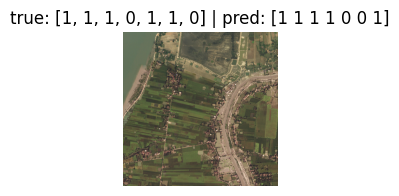

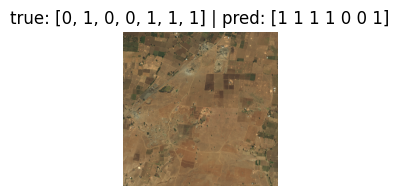

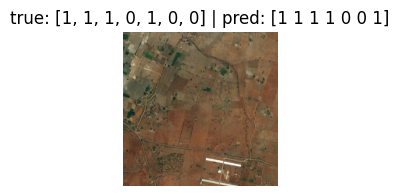

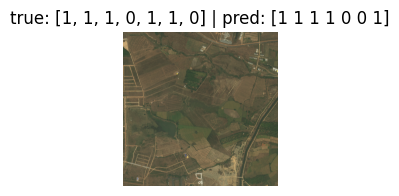

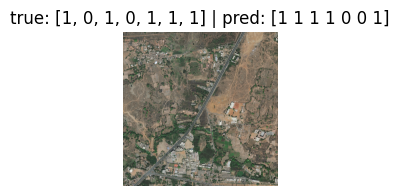

Classification Report:
              precision    recall  f1-score   support

       Urban       0.70      1.00      0.82         7
 Agriculture       0.90      1.00      0.95         9
   Rangeland       0.70      1.00      0.82         7
      Forest       0.20      1.00      0.33         2
       Water       0.00      0.00      0.00         8
      Barren       0.00      0.00      0.00         6
     Unknown       0.50      1.00      0.67         5

   micro avg       0.60      0.68      0.64        44
   macro avg       0.43      0.71      0.51        44
weighted avg       0.47      0.68      0.55        44
 samples avg       0.60      0.69      0.64        44

Percentage of each class correctly identified (when present):
Urban               : 100.0%
Agriculture         : 100.0%
Rangeland           : 100.0%
Forest              : 100.0%
Water               : 0.0%
Barren              : 0.0%
Unknown             : 100.0%
Overall label-wise correctness score: 0.514 (51.4%)

Correctness 

In [ ]:
val_meta = meta.iloc[793:803].reset_index(drop=True)
evaluate_model(model3, val_meta, rgb, thresholds=thresholds)

## Model 4: Training in chunks to speed up learning process

In [ ]:
tiles_per_chunk = 3000
epochs_per_chunk = 5
batch_size=16
epochs=5

def train_in_chunks(meta, tiles_per_chunk=tiles_per_chunk):
  """
  trains model in chunks to save memory by loading pre saved tiles then clearing each time
  inputs: meta, meta for 'sat_image_path'
  tiles_per_chunk, number of tiles to load at once
  output: history list
  """
  total = 0
  tile_buffer = []
  label_buffer = []
  history_list = []

  for i, row in enumerate(meta.itertuples()):
    base = os.path.splitext(os.path.basename(row.sat_image_path))[0]
    tile_path = os.path.join(cache_meta, f"{base}_tiles.npy")
    label_path = os.path.join(cache_meta, f"{base}_labels.npy")

    if os.path.exists(tile_path) and os.path.exists(label_path):
      tiles = np.load(tile_path, allow_pickle=True)
      labels = np.load(label_path, allow_pickle=True)

      for t, l in zip(tiles, labels): #storing tiles and labels in buffer for efficiency
        tile_buffer.append(t)
        label_buffer.append(l)
        total += 1

        if total >= tiles_per_chunk:
          #train on chunk
          x = np.array(tile_buffer, dtype=np.float32)
          y = np.array(label_buffer, dtype=np.float32)
          ds = tf.data.Dataset.from_tensor_slices((x, y)).batch(batch_size).prefetch(tf.data.AUTOTUNE)

          print(f"Training on {len(x)} tiles...")
          history = model4.fit(ds, epochs=epochs_per_chunk)
          history_list.append(history.history)

          #clear memory to avoid crash
          del x, y, ds, tile_buffer, label_buffer
          tile_buffer = []
          label_buffer = []
          total = 0
          gc.collect() #free ram

  #train on remaining tiles not in chunk
  if tile_buffer:
    x = np.array(tile_buffer, dtype=np.float32)
    y = np.array(label_buffer, dtype=np.float32)
    ds = tf.data.Dataset.from_tensor_slices((x, y)).batch(batch_size).prefetch(tf.data.AUTOTUNE)
    print(f"Final training on {len(x)} tiles...")
    model4.fit(ds, epochs=epochs_per_chunk)
    del x, y, ds, tile_buffer, label_buffer
    gc.collect()

  return history_list

In [ ]:
model4 = build_mobilenet_model()
#train_in_chunks(train_meta[:793])

<ipython-input-32-08b17ea2c607>:11: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')


In [ ]:
#model4.save("/content/drive/MyDrive/model4_mobilenetCHUNKS.keras")
#loading pre calculated model from previus notebook
#model4=load_model("/content/drive/MyDrive/mobilenet_tile_classifier_chunked.keras")
model4=load_model("/content/drive/MyDrive/model4_mobilenetCHUNKS.keras")
model4.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ true_divide_1 (TrueDivide)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ subtract_1 (Subtract)                │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 8, 8, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 7)                   │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,752,599 (10.50 MB)

 Trainable params: 164,871 (644.03 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 329,744 (1.26 MB)

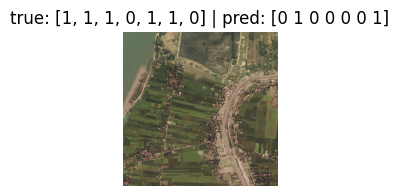

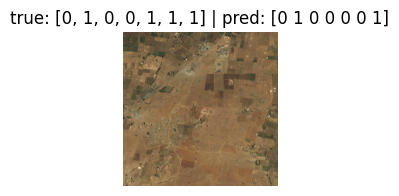

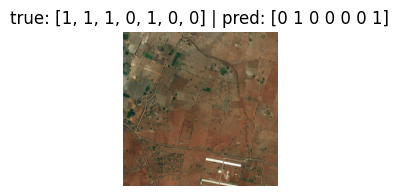

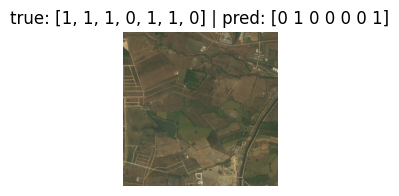

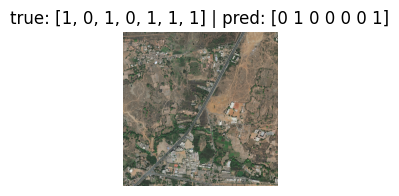

Classification Report:
              precision    recall  f1-score   support

       Urban       0.00      0.00      0.00         7
 Agriculture       0.90      1.00      0.95         9
   Rangeland       0.00      0.00      0.00         7
      Forest       0.00      0.00      0.00         2
       Water       0.00      0.00      0.00         8
      Barren       0.00      0.00      0.00         6
     Unknown       0.50      1.00      0.67         5

   micro avg       0.70      0.32      0.44        44
   macro avg       0.20      0.29      0.23        44
weighted avg       0.24      0.32      0.27        44
 samples avg       0.70      0.34      0.45        44

Percentage of each class correctly identified (when present):
Urban               : 0.0%
Agriculture         : 100.0%
Rangeland           : 0.0%
Forest              : 0.0%
Water               : 0.0%
Barren              : 0.0%
Unknown             : 100.0%
Overall label-wise correctness score: 0.486 (48.6%)

Correctness per cl

In [ ]:
val_meta = meta.iloc[793:803].reset_index(drop=True)
evaluate_model(model4, val_meta, rgb, thresholds=thresholds)

## Model 5: Using MobilNetV2 and reshaping the images instead of using sliding window to improve learning speeds

Reshaping the images from 2448x2448 to 256x256 will mean they lose some finer details, hence we will invesigate if this method is still viable for binary terrain classification

In [ ]:
def reshape_image_dataset(meta, rgb, image_size=(256, 256)):
  """
  loads and resizes full satellite images and computes class labels
  inputs: meta,
  rgb, list of rgb values for each class
  image_size, size to resize images to
  output: images, labels
  """
  images = []
  for i in range(len(meta)):
      image = imageio.imread(meta.iloc[i]['sat_image_path'])
      image = tf.image.resize(image, image_size).numpy() / 255.0
      images.append(image)

  labels = create_binary_labels(meta, rgb)
  return np.array(images), labels


In [ ]:
save_meta = "/content/drive/MyDrive/reshaped_images"
os.makedirs(save_meta, exist_ok=True)


resize_shape = (256, 256)
all_images=[]


#for i, row in tqdm(meta.iterrows(), total=len(meta), desc="Resizing images"):
    #image = imageio.imread(row['sat_image_path'])
    #resized = tf.image.resize(image, resize_shape).numpy() / 255.0
    #all_images.append(resized)

# Save as single array
#all_images = np.stack(all_images).astype(np.float32)
#np.save(os.path.join(save_meta, "all_images_256.npy"), all_images)


In [ ]:
resized_images=np.load("/content/drive/MyDrive/reshaped_images/all_images_256.npy")
all_labels = np.load("/content/drive/MyDrive/train_labels.npy")

train_images = resized_images[:750]
train_labels = all_labels[:750]

val_images=resized_images[751:803]
val_labels=all_labels[751:803]

model5 = build_mobilenet_model(input_shape=(256, 256, 3), num_classes=len(rgb))
#model5.fit(train_images, train_labels, validation_data=(val_images, val_labels), epochs=5, batch_size=32)

<ipython-input-32-08b17ea2c607>:11: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')


In [ ]:
#model5.save("/content/drive/MyDrive/model5_mobilenetRESHAPE.keras")
moddel5= load_model("/content/drive/MyDrive/model5_mobilenetRESHAPE.keras")

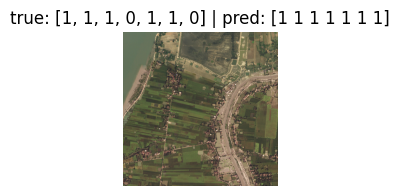

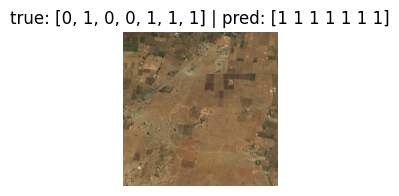

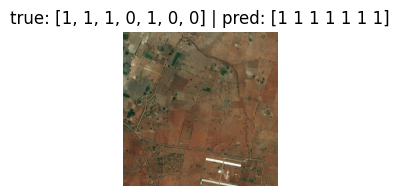

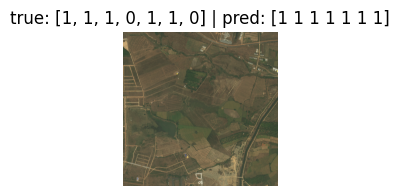

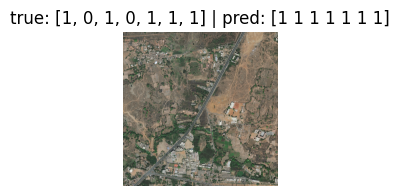

Classification Report:
              precision    recall  f1-score   support

       Urban       0.70      1.00      0.82         7
 Agriculture       0.90      1.00      0.95         9
   Rangeland       0.70      1.00      0.82         7
      Forest       0.20      1.00      0.33         2
       Water       0.80      1.00      0.89         8
      Barren       0.60      1.00      0.75         6
     Unknown       0.50      1.00      0.67         5

   micro avg       0.63      1.00      0.77        44
   macro avg       0.63      1.00      0.75        44
weighted avg       0.70      1.00      0.81        44
 samples avg       0.63      1.00      0.77        44

Percentage of each class correctly identified (when present):
Urban               : 100.0%
Agriculture         : 100.0%
Rangeland           : 100.0%
Forest              : 100.0%
Water               : 100.0%
Barren              : 100.0%
Unknown             : 100.0%
Overall label-wise correctness score: 0.629 (62.9%)

Correctn

In [ ]:
evaluate_model(model5, val_meta, rgb, thresholds=thresholds)

with the current thresholds the model predicts all classes are present. We will change the threshold back to 0.5 for all images.

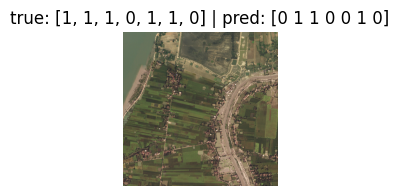

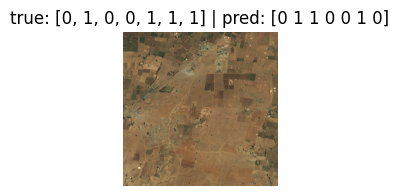

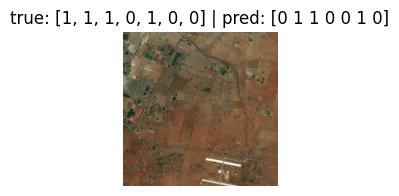

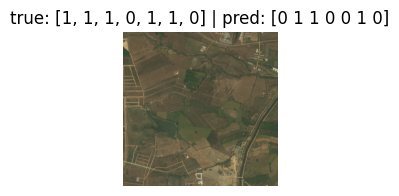

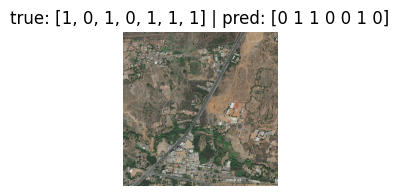

Classification Report:
              precision    recall  f1-score   support

       Urban       0.00      0.00      0.00         7
 Agriculture       0.90      1.00      0.95         9
   Rangeland       0.70      1.00      0.82         7
      Forest       0.00      0.00      0.00         2
       Water       0.00      0.00      0.00         8
      Barren       0.60      1.00      0.75         6
     Unknown       0.00      0.00      0.00         5

   micro avg       0.73      0.50      0.59        44
   macro avg       0.31      0.43      0.36        44
weighted avg       0.38      0.50      0.43        44
 samples avg       0.73      0.49      0.58        44

Percentage of each class correctly identified (when present):
Urban               : 0.0%
Agriculture         : 100.0%
Rangeland           : 100.0%
Forest              : 0.0%
Water               : 0.0%
Barren              : 100.0%
Unknown             : 0.0%
Overall label-wise correctness score: 0.571 (57.1%)

Correctness per 

In [ ]:
evaluate_model(model5, val_meta, rgb, thresholds=None)

This is the best corectness score so far at 71.4%, however the model is still predicting the same label for each image.

# 2. Develop a machine learning algorithm that can determine the fraction of each class that is present in the image (e.g. what fraction of pixels are Urban vs Agricultutal etc.)

we will use the best trained model 5 to calculate class fractions from

In [ ]:
def compute_fractions_from_prediction(pred_mask):
  """
  Compute class fractions from a U-Net softmax mask output
  input: pred_mask, softmax mask output
  output: list of fractions for each class
  """
  class_map = np.argmax(pred_mask, axis=-1)  # most likely class at each pixel
  total_pixels = class_map.size
  return [(class_map == c).sum() / total_pixels for c in range(pred_mask.shape[-1])] #frac for each class

def compute_class_fractions_from_array(mask_class, num_classes):
  """
  computes class fractions from class mask
  input: mask_class, class mask
  num_classes, number of classes
  output: list of fractions for each class
  """
  total_pixels = mask_class.size
  return [(mask_class == i).sum() / total_pixels for i in range(num_classes)]

In [ ]:
for i in range(5):
    image = imageio.imread(val_meta.iloc[i]['sat_image_path']) / 255.0
    mask_rgb = imageio.imread(val_meta.iloc[i]['mask_path'])
    mask_class = rgb_to_class(mask_rgb, rgb)

    #true fractions
    true_frac = compute_class_fractions_from_array(mask_class, num_classes=len(rgb))
    #predicted fractions
    pred_mask = model5.predict(np.expand_dims(image, axis=0))[0]  # shape (256, 256, num_classes)
    pred_frac = compute_fractions_from_prediction(pred_mask)

    print(f"\nImage {i}")
    print("True Fractions:     ", np.round(true_frac, 3))
    print("Predicted Fractions:", np.round(pred_frac, 3))

1/1 ━━━━━━━━━━━━━━━━━━━━ 21s 21s/step

Image 0
True Fractions:      [0.004 0.664 0.181 0.    0.131 0.02  0.   ]
Predicted Fractions: [0. 0. 0. 0. 0. 1. 0.]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step

Image 1
True Fractions:      [0.    0.792 0.    0.    0.004 0.204 0.   ]
Predicted Fractions: [0. 0. 0. 0. 0. 1. 0.]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step

Image 2
True Fractions:      [0.009 0.906 0.085 0.    0.    0.    0.   ]
Predicted Fractions: [0. 0. 0. 0. 0. 1. 0.]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step

Image 3
True Fractions:      [0.011 0.535 0.393 0.    0.019 0.043 0.   ]
Predicted Fractions: [0. 0. 0. 0. 0. 1. 0.]
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step

Image 4
True Fractions:      [0.257 0.    0.047 0.    0.    0.696 0.   ]
Predicted Fractions: [0. 0. 0. 0. 0. 1. 0.]


As most images have agrigulure present, the model is giving the same fraction for all classes, with 100% agriculture prediction.

#3.Develop a machine learning algorithm that is capable of classifying each pixel of a satellite image into one of the above classes

## Model: U-Net Model - Semantic Segmentation

In [ ]:
def reshape_image_and_masks():
  """
  loads full images and masks, resizes and saves to google drive
  inputs: none
  output: none
  """
  resize_shape = (256, 256)
  all_images = []
  all_masks = []
  for whichImg in tqdm(range(803), desc="Resizing Images and RGB Masks"):
    #load satellite image and mask
    im = imageio.imread(meta['sat_image_path'][whichImg])
    mask_rgb = imageio.imread(meta['mask_path'][whichImg])

    #resize and normalise
    im_resized = tf.image.resize(im, resize_shape).numpy().astype(np.uint8) / 255.0
    all_images.append(im_resized)

    #resize rgb mask
    mask_resized_rgb = tf.image.resize(mask_rgb, resize_shape, method='nearest').numpy().astype(np.uint8) #(nearest = preserves color values)
    all_masks.append(mask_resized_rgb)

  #stack and save
  all_images = np.stack(all_images).astype(np.float32)
  all_masks = np.stack(all_masks).astype(np.uint8)

  output_dir = "/content/drive/MyDrive/reshaped_images"
  os.makedirs(output_dir, exist_ok=True)

  np.save(os.path.join(output_dir, "images_resized.npy"), all_images)
  np.save(os.path.join(output_dir, "masks_rgb_resized.npy"), all_masks)

#reshape_image_and_masks()


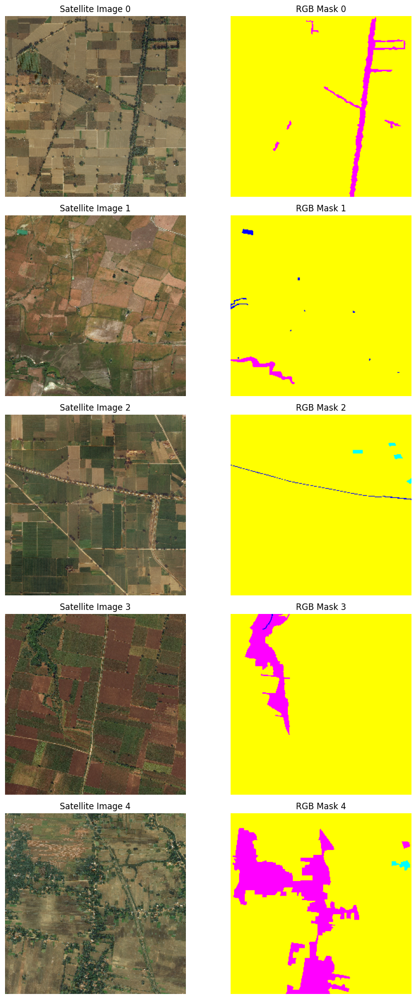

In [ ]:
#loading the resized image and RGB mask arrays
images = np.load("/content/drive/MyDrive/reshaped_images/images_resized.npy")
masks_rgb = np.load("/content/drive/MyDrive/reshaped_images/masks_rgb_resized.npy")

def show_samples(images, masks_rgb, num_samples=5):
    """
    display satellite images and corresponding rgb masks
    inputs: images, satellite images
    masks_rgb, rgb masks
    num_samples, number of samples to display
    output: none
    """
    plt.figure(figsize=(10, 4 * num_samples))
    for i in range(num_samples):
        #img
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(images[i])
        plt.title(f"Satellite Image {i}")
        plt.axis('off')

        #mask
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(masks_rgb[i])
        plt.title(f"RGB Mask {i}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# show 5 resized samples to check
show_samples(images, masks_rgb, num_samples=5)


In [ ]:
def build_unet_model(input_shape=(256, 256, 3), num_classes=7):
  """
  builds u net model for semantic segmentation
  inputs: input_shape, shape of input image
  num_classes, number of classes to classify between
  output: model, complied cnn model ready to train
  """

  inputs = layers.Input(shape=input_shape) #input layer

  #encoder
  c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
  c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(c1)
  p1 = layers.MaxPooling2D((2, 2))(c1)

  c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
  c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(c2)
  p2 = layers.MaxPooling2D((2, 2))(c2)

  #bottle neck
  b = layers.Conv2D(128, 3, activation='relu', padding='same')(p2)
  b = layers.Conv2D(128, 3, activation='relu', padding='same')(b)

  #decoder
  u3 = layers.Conv2DTranspose(64, 2, strides=2, padding='same')(b)
  u3 = layers.concatenate([u3, c2]) #skip connection
  c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(u3)
  c3 = layers.Conv2D(64, 3, activation='relu', padding='same')(c3)

  u4 = layers.Conv2DTranspose(32, 2, strides=2, padding='same')(c3)
  u4 = layers.concatenate([u4, c1])
  c4 = layers.Conv2D(32, 3, activation='relu', padding='same')(u4)
  c4 = layers.Conv2D(32, 3, activation='relu', padding='same')(c4)

  outputs = layers.Conv2D(num_classes, (1, 1), activation='softmax')(c4)
  model = models.Model(inputs=[inputs], outputs=[outputs])
  return model



In [ ]:
from sklearn.utils import shuffle
#convert RGB masks to class labels
masks_class = np.stack([rgb_to_class(m, rgb) for m in masks_rgb]).astype(np.uint8)
train_images, train_masks = shuffle(images[:753], masks_class[:753], random_state=42)   #train images and masks
test_images, test_masks = shuffle(images[753:803], masks_class[753:803], random_state=42)   #test images the model will not see

In [ ]:

unet_model = build_unet_model(input_shape=(256, 256, 3), num_classes=7)

unet_model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

history = unet_model.fit(
    train_images, train_masks,
    epochs=10,
    batch_size=8,
    validation_split=0.2,
    shuffle=True
)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1576']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)


76/76 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - accuracy: 0.5662 - loss: 1.5059 - val_accuracy: 0.5852 - val_loss: 1.3212
Epoch 2/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5615 - loss: 1.3688 - val_accuracy: 0.5852 - val_loss: 1.2970
Epoch 3/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5579 - loss: 1.3376 - val_accuracy: 0.5897 - val_loss: 1.2637
Epoch 4/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5907 - loss: 1.2532 - val_accuracy: 0.6102 - val_loss: 1.2420
Epoch 5/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.6139 - loss: 1.1940 - val_accuracy: 0.6118 - val_loss: 1.1825
Epoch 6/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5955 - loss: 1.1935 - val_accuracy: 0.6305 - val_loss: 1.1669
Epoch 7/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.6215 - loss: 1.1704 - val_accuracy: 0.6043 - val_loss: 1.2559
Epoch 8/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.5918 - loss: 1.1833 - val_accuracy: 0.6141 - val_loss: 

In [ ]:
unet_model.save("/content/drive/MyDrive/unet_model.keras")

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.6435 - loss: 1.0457
Test Loss: 1.0517
Test Accuracy: 0.6348


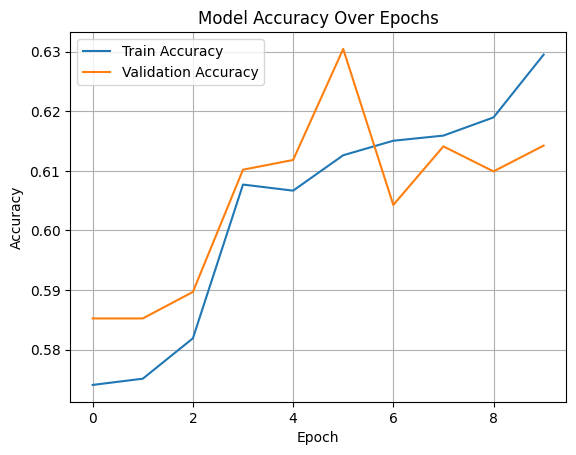

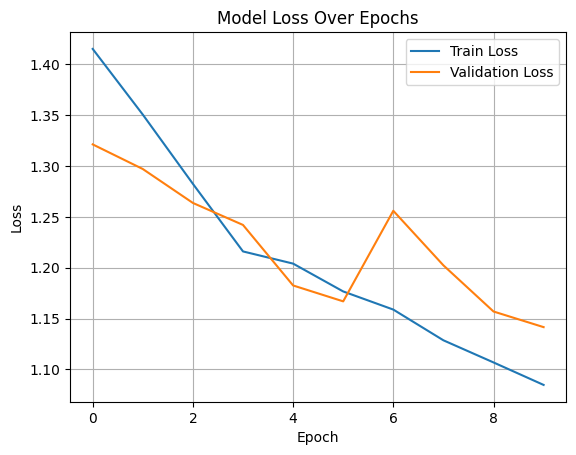

In [ ]:
evaluate_loss(unet_model, test_images, test_masks)

The overall trend of accuracy increaseing and loss decreasing is encouraging, howvever the loss is high.

In [ ]:
# Manual RGB color map for each class index
class_colours = {
    0: (0, 255, 0),      # Agriculture - green
    1: (0, 0, 255),      # Forest - blue
    2: (255, 255, 0),    # Urban - yellow
    3: (255, 0, 0),      # Road - red
    4: (0, 255, 255),    # Water - cyan
    5: (255, 0, 255),    # Bare land - magenta
    6: (160, 82, 45),    # Unknown / other - brown
}

def class_to_rgb(mask, class_colours):
  """convert class index mask to rgb
  input: mask, class index mask
  class_colours, manual rgb color map for each class index
  output: rgb mask
  """
  h, w = mask.shape
  rgb_mask = np.zeros((h, w, 3), dtype=np.uint8)
  for class_index, colour in class_colours.items():
      rgb_mask[mask == class_index] = colour #assign colour where mask equals class index
  return rgb_mask

def show_predictions(images, true_masks, pred_masks, class_colours, n=3):
  """
  displays images, true masks and predicted masks
  inputs: images, true masks, predicted masks
  class_colours, manual rgb color map for each class index
  n, number of images to display
  """
  for i in range(n):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(images[i])
    plt.title("Input image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(class_to_rgb(true_masks[i], class_colours))
    plt.title("True Mask")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(class_to_rgb(pred_masks[i], class_colours))
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1576']
Received: inputs=Tensor(shape=(32, 256, 256, 3))
  warnings.warn(msg)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 480ms/step


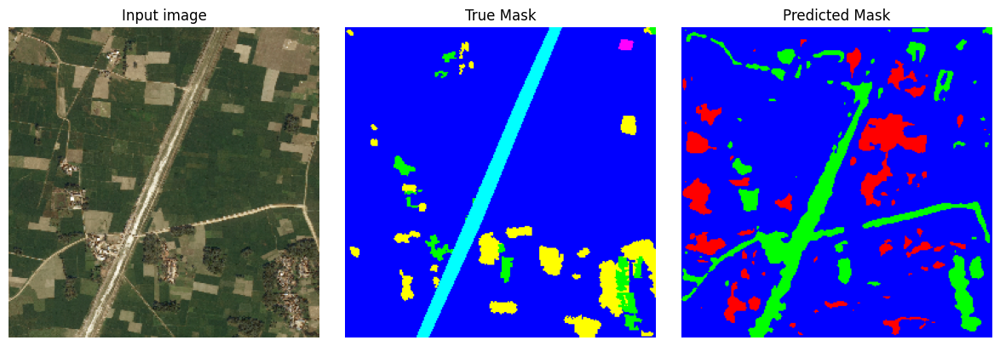

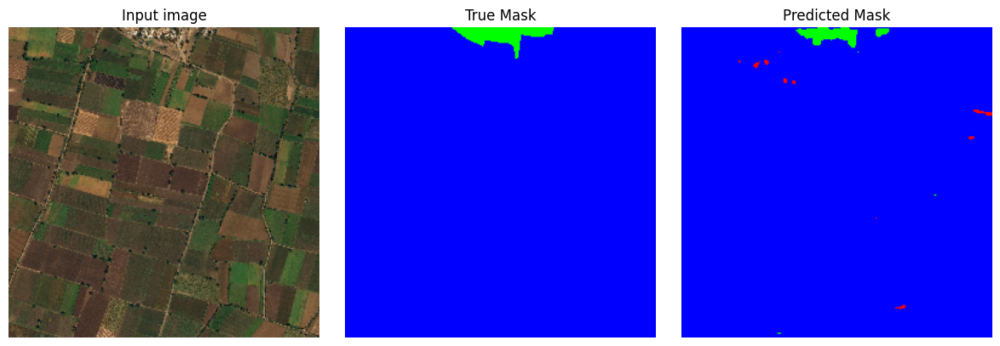

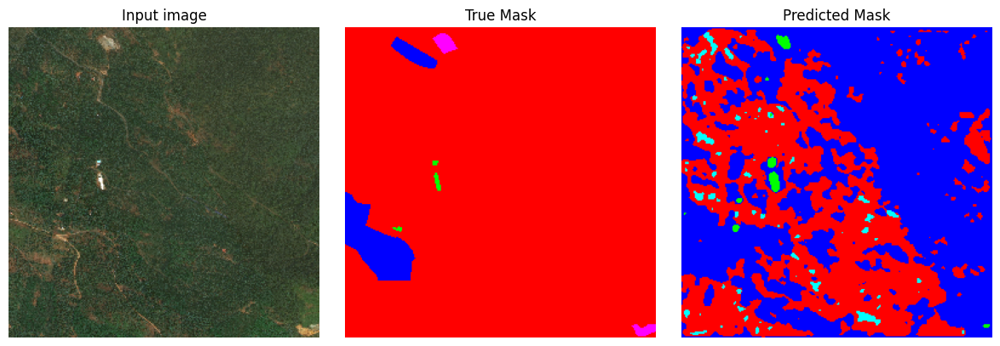

In [ ]:
pred_probs = unet_model.predict(test_images)
pred_classes = np.argmax(pred_probs, axis=-1)
show_predictions(test_images, test_masks, pred_classes,class_colours, n=3)

# Unet model 2 with more layers to increase accuracy

In [ ]:
def build_unet_model2(input_shape=(128, 128, 3), num_classes=7):
  #input layer
  inputs = tf.keras.layers.Input(shape=input_shape)

  #encoder
  c1 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', padding='same')(inputs)
  c1 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', padding='same')(c1)
  p1 = tf.keras.layers.MaxPooling2D((2,2))(c1)

  c2 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same')(p1)
  c2 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same')(c2)
  p2 = tf.keras.layers.MaxPooling2D((2,2))(c2)

  c3 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same')(p2)
  c3 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same')(c3)
  p3 = tf.keras.layers.MaxPooling2D((2,2))(c3)

  c4 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same')(p3)
  c4 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same')(c4)
  p4 = tf.keras.layers.MaxPooling2D((2,2))(c4)

  #bottleneck
  c5 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', padding='same')(p4)
  c5 = tf.keras.layers.Conv2D(256, (3,3), activation='relu', padding='same')(c5)

  #decoder
  u6 = tf.keras.layers.Conv2DTranspose(128, (2,2), strides=(2,2), padding='same')(c5)
  u6 = tf.keras.layers.concatenate([u6, c4])
  c6 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same')(u6)
  c6 = tf.keras.layers.Conv2D(128, (3,3), activation='relu', padding='same')(c6)

  u7 = tf.keras.layers.Conv2DTranspose(64, (2,2), strides=(2,2), padding='same')(c6)
  u7 = tf.keras.layers.concatenate([u7, c3])
  c7 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same')(u7)
  c7 = tf.keras.layers.Conv2D(64, (3,3), activation='relu', padding='same')(c7)

  u8 = tf.keras.layers.Conv2DTranspose(32, (2,2), strides=(2,2), padding='same')(c7)
  u8 = tf.keras.layers.concatenate([u8, c2])
  c8 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same')(u8)
  c8 = tf.keras.layers.Conv2D(32, (3,3), activation='relu', padding='same')(c8)

  u9 = tf.keras.layers.Conv2DTranspose(16, (2,2), strides=(2,2), padding='same')(c8)
  u9 = tf.keras.layers.concatenate([u9, c1])
  c9 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', padding='same')(u9)
  c9 = tf.keras.layers.Conv2D(16, (3,3), activation='relu', padding='same')(c9)


  outputs = tf.keras.layers.Conv2D(num_classes, (1,1), activation='softmax')(c9)

  model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
  return model

In [ ]:
unet_model2 = build_unet_model2(input_shape=(256, 256, 3), num_classes=7)

unet_model2.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

history = unet_model2.fit(
    train_images, train_masks,
    epochs=10,
    batch_size=8,
    validation_split=0.2,
    shuffle=True
)

Epoch 1/10


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1594']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)


76/76 ━━━━━━━━━━━━━━━━━━━━ 22s 128ms/step - accuracy: 0.5948 - loss: 1.5202 - val_accuracy: 0.5852 - val_loss: 1.4062
Epoch 2/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6114 - loss: 1.3002 - val_accuracy: 0.5854 - val_loss: 1.2496
Epoch 3/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.5812 - loss: 1.2417 - val_accuracy: 0.6348 - val_loss: 1.1730
Epoch 4/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6139 - loss: 1.1969 - val_accuracy: 0.6445 - val_loss: 1.1384
Epoch 5/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - accuracy: 0.6492 - loss: 1.0988 - val_accuracy: 0.6242 - val_loss: 1.1726
Epoch 6/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6087 - loss: 1.1748 - val_accuracy: 0.6046 - val_loss: 1.2860
Epoch 7/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6290 - loss: 1.1541 - val_accuracy: 0.6383 - val_loss: 1.1208
Epoch 8/10
76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - accuracy: 0.6190 - loss: 1.1330 - val_accuracy: 0.6165 - val_loss: 

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.7020 - loss: 1.0074
Test Loss: 1.0091
Test Accuracy: 0.6962


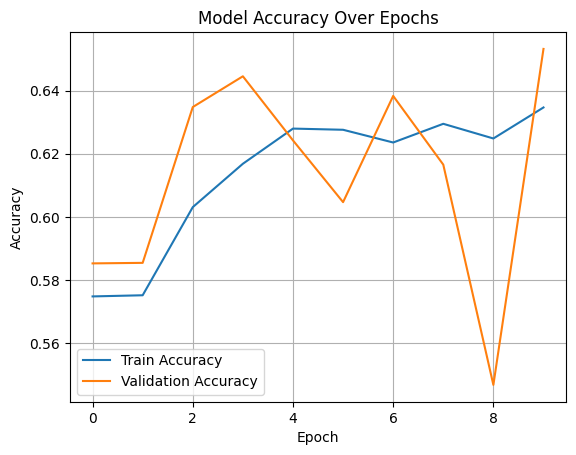

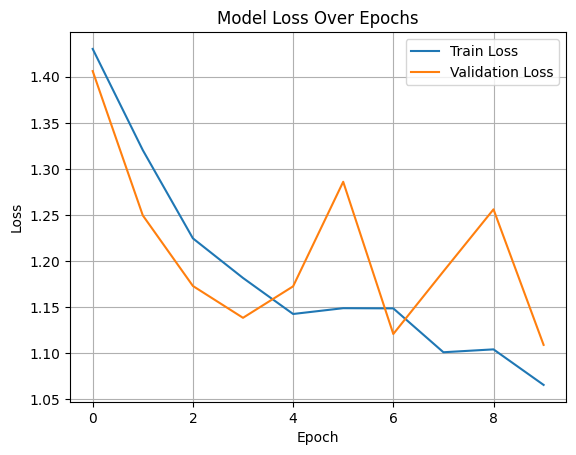

In [ ]:
evaluate_loss(unet_model2, test_images, test_masks)

This model has high accuracy, however it also has high loss. This suggests it has bad segmentation and is just learning the most common terrain types. To fix this problem i will balance out the dataset by augmenting the data, so the model learns all classes equally.

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1594']
Received: inputs=Tensor(shape=(32, 256, 256, 3))
  warnings.warn(msg)


1/2 ━━━━━━━━━━━━━━━━━━━━ 0s 821ms/step

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 740ms/step


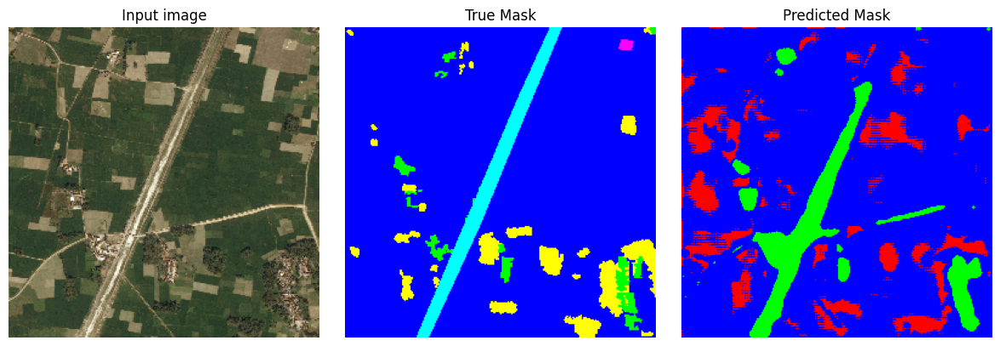

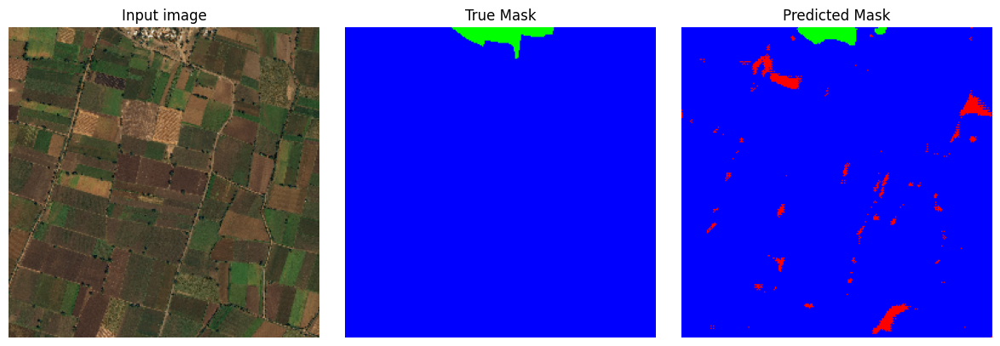

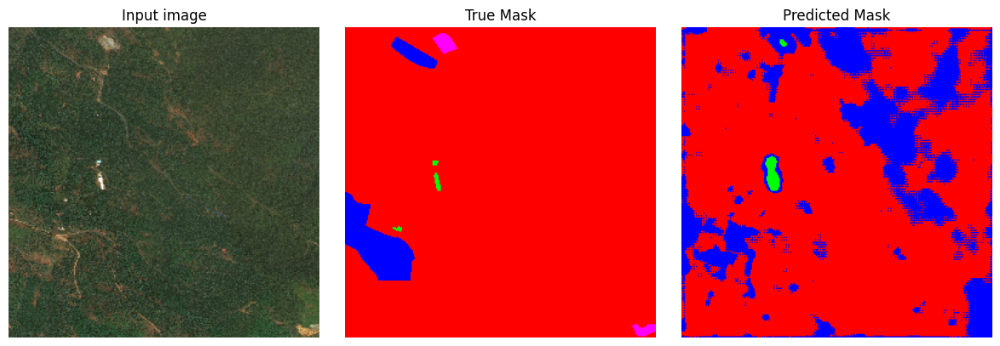

In [ ]:
pred_probs = unet_model2.predict(test_images)
pred_classes = np.argmax(pred_probs, axis=-1)
show_predictions(test_images, test_masks, pred_classes,class_colours, n=3)

# U-net model 3: Including weights and data augmentation

this is intended to mitigate the models tendancy to just predict the dominant class- agriculture - which appears in 81% of images.
The weights are applied proportional to pixel distribution- the more underrepresented the class, the greater weight assigned to it.

In [ ]:
flat_pixels = masks_class[:753].reshape(-1)     #flatten masks
pixel_counts = np.bincount(flat_pixels, minlength=7) #count num of pixels belonging to each class
inv_freq = 1.0 / pixel_counts
pixel_class_weights = inv_freq / np.mean(inv_freq)  #normalising
class_weights_dict = {i: w for i, w in enumerate(pixel_class_weights)}  #map class to weight

print(class_weights_dict)

{0: np.float64(0.033431986779546875), 1: np.float64(0.006303687170763514), 2: np.float64(0.04342118949370821), 3: np.float64(0.032759956360829956), 4: np.float64(0.10766489541486819), 5: np.float64(0.042888397554152496), 6: np.float64(6.733529887226131)}


In [ ]:
def weighted_sparse_categorical_crossentropy(class_weights):
  """
  creates a weighted sparse categorical crossentropy loss function
  input: class_weights, dictionary mapping class index to weight
  output: loss function
  """

  weights = tf.constant(list(class_weights.values()), dtype=tf.float32)

  def loss_fn(true_label, pred_label):
    true_label = tf.cast(true_label, tf.int32) #cast true labels to integer indices
    true_label_flat = tf.reshape(true_label, [-1])  # flatten labels for comparison
    pred_label_flat = tf.reshape(pred_label, [-1, pred_label.shape[-1]])

    weight_per_pixel = tf.gather(weights, true_label_flat) #gather weight for each pixel based off true class
    ce = tf.keras.losses.sparse_categorical_crossentropy(true_label_flat, pred_label_flat) #compute SSSE loss
    weighted_ce = weight_per_pixel * ce #appling class weights to the loss per pixel
    return tf.reduce_mean(weighted_ce) #avg loss over all pixels

  return loss_fn



loss_fn = weighted_sparse_categorical_crossentropy(class_weights_dict)

In [ ]:
def contains_rare_class(mask, rare_classes):
  """
  checks if mask contains rare classes
  input: mask, class index mask
  rare_classes, list of rare classes
  output: boolean : true if mask contains rare classes, false otherwise
  """
  unique_classes = np.unique(mask)
  return any(cls in unique_classes for cls in rare_classes)

In [ ]:
rare_classes = [3, 4, 5, 6]
#identify which masks contain rare classes
rare_mask_flags = [contains_rare_class(m, rare_classes) for m in train_masks]
rare_mask_flags_array = np.array(rare_mask_flags)
rare_images = train_images[rare_mask_flags_array]
rare_masks = train_masks[rare_mask_flags_array]
common_images = train_images[np.logical_not(rare_mask_flags_array)]
common_masks = train_masks[np.logical_not(rare_mask_flags_array)]


In [ ]:
def augment(image, mask):
  """
  applies random data augmentation to image and mask to make train dataset larger, flips and rotations
  input: image, mask
  output: augmented image, mask
  """
  mask = tf.expand_dims(mask, axis=-1)  #add channel dimension to mask for processing

  #horizontal flip
  if tf.random.uniform(()) > 0.5:
    image = tf.image.flip_left_right(image)
    mask = tf.image.flip_left_right(mask)

  #vertical flip
  if tf.random.uniform(()) > 0.5:
    image = tf.image.flip_up_down(image)
    mask = tf.image.flip_up_down(mask)

  #rotation
  k = tf.random.uniform((), minval=0, maxval=4, dtype=tf.int32)
  image = tf.image.rot90(image, k)
  mask = tf.image.rot90(mask, k)

  #mask to 2D
  mask = tf.squeeze(mask, axis=-1)

  return image, mask

def create_augmented_dataset(images, masks, batch_size=8):
  """
  builds a tf dataset with augmented images and masks and bacthing
  input: images, masks, batch_size
  output: tf dataset
  """
  dataset = tf.data.Dataset.from_tensor_slices((images, masks)) #pair img and mask
  dataset = dataset.map(lambda x, y: augment(x, y), num_parallel_calls=tf.data.AUTOTUNE) #augment
  dataset = dataset.shuffle(100) #shuffle for training
  dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)  #pre fetch batches for speed
  return dataset

In [ ]:
augmented_rare = create_augmented_dataset(rare_images, rare_masks, batch_size=8)
common_ds = tf.data.Dataset.from_tensor_slices((common_images, common_masks))
common_ds = common_ds.batch(8).prefetch(tf.data.AUTOTUNE)


#combining rare and common images and masks into full arrays
all_images = np.concatenate([rare_images, common_images])
all_masks = np.concatenate([rare_masks, common_masks])



train_imgs, val_imgs, train_lbls, val_lbls = train_test_split(
    all_images, all_masks,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

#apply augmentation to training data
train_dataset = create_augmented_dataset(train_imgs, train_lbls, batch_size=8)

#keeping val unaugmented
val_dataset = tf.data.Dataset.from_tensor_slices((val_imgs, val_lbls)).batch(8).prefetch(tf.data.AUTOTUNE)


In [ ]:
unet_model3 = build_unet_model(input_shape=(256, 256, 3), num_classes=7)
unet_model3.compile(optimizer='adam', loss=loss_fn, metrics=['accuracy'])

#Train on the augmented dataset
history = unet_model3.fit(
    train_dataset,
    epochs=30,
    validation_data=val_dataset
)

Epoch 1/30


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1626']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)


76/76 ━━━━━━━━━━━━━━━━━━━━ 12s 70ms/step - accuracy: 0.1240 - loss: 0.0492 - val_accuracy: 0.0292 - val_loss: 0.0492
Epoch 2/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0461 - loss: 0.0479 - val_accuracy: 0.1091 - val_loss: 0.0492
Epoch 3/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0785 - loss: 0.0459 - val_accuracy: 0.1141 - val_loss: 0.0481
Epoch 4/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0936 - loss: 0.0504 - val_accuracy: 0.0461 - val_loss: 0.0490
Epoch 5/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0749 - loss: 0.0481 - val_accuracy: 0.0171 - val_loss: 0.0483
Epoch 6/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0582 - loss: 0.0452 - val_accuracy: 0.0311 - val_loss: 0.0491
Epoch 7/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0760 - loss: 0.0451 - val_accuracy: 0.0271 - val_loss: 0.0492
Epoch 8/30
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.0390 - loss: 0.0454 - val_accuracy: 0.0266 - val_loss: 0

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step - accuracy: 0.1726 - loss: 0.0384
Test Loss: 0.0376
Test Accuracy: 0.1742


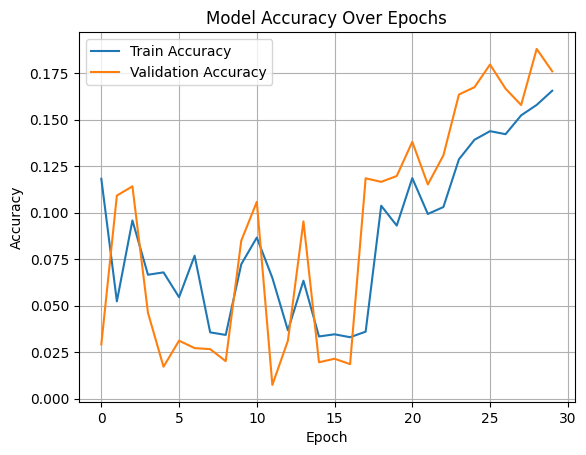

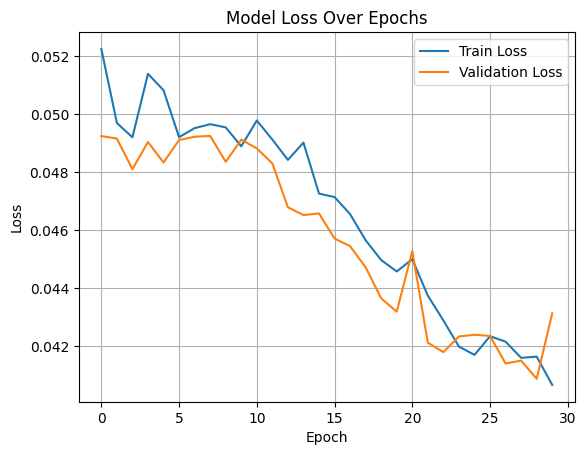

In [ ]:
evaluate_loss(unet_model3, test_images, test_masks)

The overall accuracy of the model is lower than before adding the weights, however this is a misleading statistic. By adding the weights, the model can no longer just predict the dominant class and get a better result, and is instead laerning all classes including the rare ones. This is shown by the decrease in loss. Therefore, this model is a better model than U-Net model 3, we will attempt to improve its accuracy by increasing epochs and adding more layers.

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_1626']
Received: inputs=Tensor(shape=(32, 256, 256, 3))
  warnings.warn(msg)


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 468ms/step


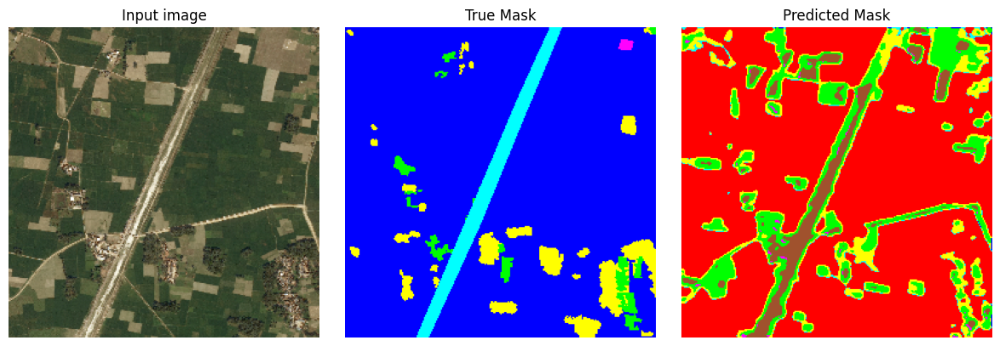

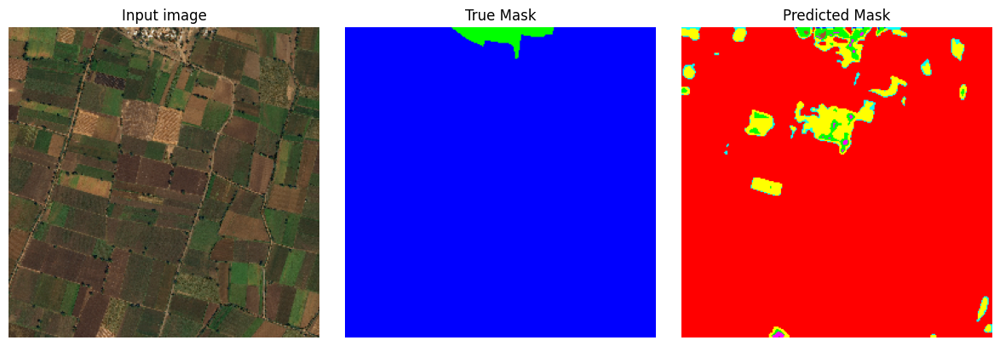

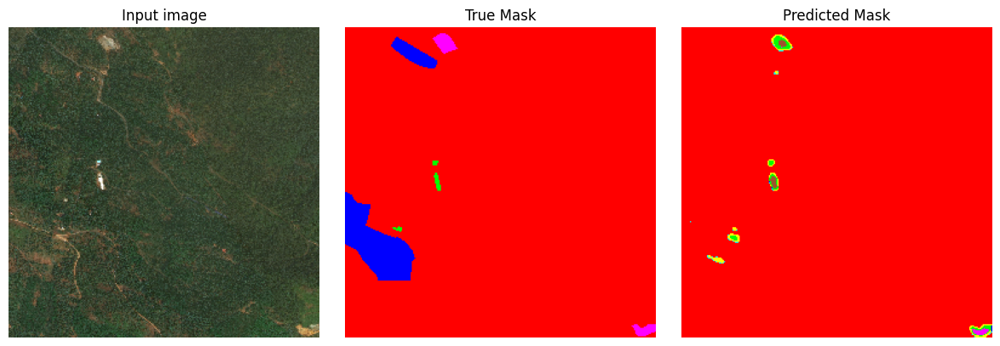

In [ ]:
pred_probs = unet_model3.predict(test_images)
pred_classes = np.argmax(pred_probs, axis=-1)
show_predictions(test_images, test_masks, pred_classes,class_colours, n=3)

The true masks only have a few blocks of colour per image, however the predicted masks are speckled with lots of classes. This suggests the model is too confident and is overfitting to noise such as vairations in colours and textures.

# U-Net model 4: Investigation into improving accuracy


To fix this we will add a dropout in the decoder right before the output layer to make the predictions less irregular. We will also slightly reduce the augmentation of rare classes to try prevent some overfitting.

In [ ]:
def augment(image, mask):
  """
  applies random data augmentation to image and mask to make train dataset larger, flips and rotations
  input: image, mask
  output: augmented image, mask
  """
  mask = tf.expand_dims(mask, axis=-1)  #add channel dimension to mask for processing

  #horizontal flip
  if tf.random.uniform(()) > 0.7:
    image = tf.image.flip_left_right(image)
    mask = tf.image.flip_left_right(mask)

  #vertical flip
  if tf.random.uniform(()) > 0.5:
    image = tf.image.flip_up_down(image)
    mask = tf.image.flip_up_down(mask)

  #rotation
  k = tf.random.uniform((), minval=0, maxval=4, dtype=tf.int32)
  image = tf.image.rot90(image, k)
  mask = tf.image.rot90(mask, k)

  #mask to 2D
  mask = tf.squeeze(mask, axis=-1)

  return image, mask


In [ ]:
augmented_rare = create_augmented_dataset(rare_images, rare_masks, batch_size=8)
common_ds = tf.data.Dataset.from_tensor_slices((common_images, common_masks))
common_ds = common_ds.batch(8).prefetch(tf.data.AUTOTUNE)


#combining rare and common images and masks into full arrays
all_images = np.concatenate([rare_images, common_images])
all_masks = np.concatenate([rare_masks, common_masks])



train_imgs, val_imgs, train_lbls, val_lbls = train_test_split(
    all_images, all_masks,
    test_size=0.2,
    random_state=42,
    shuffle=True
)

#apply augmentation to training data
train_dataset = create_augmented_dataset(train_imgs, train_lbls, batch_size=8)

#keeping val unaugmented
val_dataset = tf.data.Dataset.from_tensor_slices((val_imgs, val_lbls)).batch(8).prefetch(tf.data.AUTOTUNE)

In [ ]:
#defining an early stopping call back to let the model train as long as needed and stop when it plateus in learning
early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=5,restore_best_weights=True)

In [ ]:
#saving the best model with checkpointing
model_checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("best_unet_model.h5",save_best_only=True,monitor="val_loss",mode="min")

In [ ]:
#improving accuracy metric with intersection over union func
def compute_iou(y_true, y_pred, num_classes=7):
  """
  computes intersection over union for each class
  input: y_true, y_pred, num_classes
  output: ious, mean_iou
  """
  ious = []
  for c in range(num_classes):
    intersection = np.logical_and(y_true == c, y_pred == c).sum() #pixels where both predictions and true match class
    union = np.logical_or(y_true == c, y_pred == c).sum()   #pixels where either pred or true is class c
    ious.append(intersection / union if union != 0 else np.nan) #compute IoU, stop dividing by zero error
  return ious, np.nanmean(ious)

In [ ]:
def build_unet_model4(input_shape=(256, 256, 3), num_classes=7):
  inputs = layers.Input(shape=input_shape)

  #encoder
  c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(inputs)
  c1 = layers.Conv2D(32, 3, activation='relu', padding='same')(c1)
  p1 = layers.MaxPooling2D((2, 2))(c1)

  c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(p1)
  c2 = layers.Conv2D(64, 3, activation='relu', padding='same')(c2)
  p2 = layers.MaxPooling2D((2, 2))(c2)

  c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(p2)
  c3 = layers.Conv2D(128, 3, activation='relu', padding='same')(c3)
  p3 = layers.MaxPooling2D((2, 2))(c3)

  c4 = layers.Conv2D(256, 3, activation='relu', padding='same')(p3)
  c4 = layers.Conv2D(256, 3, activation='relu', padding='same')(c4)
  p4 = layers.MaxPooling2D((2, 2))(c4)

  #bottleneck
  c5 = layers.Conv2D(512, 3, activation='relu', padding='same')(p4)
  c5 = layers.Dropout(0.5)(c5)
  c5 = layers.Conv2D(512, 3, activation='relu', padding='same')(c5)

  #decoder
  u6 = layers.Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
  u6 = layers.concatenate([u6, c4])
  c6 = layers.Conv2D(256, 3, activation='relu', padding='same')(u6)
  c6 = layers.Conv2D(256, 3, activation='relu', padding='same')(c6)

  u7 = layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c6)
  u7 = layers.concatenate([u7, c3])
  c7 = layers.Conv2D(128, 3, activation='relu', padding='same')(u7)
  c7 = layers.Conv2D(128, 3, activation='relu', padding='same')(c7)

  u8 = layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c7)
  u8 = layers.concatenate([u8, c2])
  c8 = layers.Conv2D(64, 3, activation='relu', padding='same')(u8)
  c8 = layers.Conv2D(64, 3, activation='relu', padding='same')(c8)

  u9 = layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c8)
  u9 = layers.concatenate([u9, c1])
  c9 = layers.Conv2D(32, 3, activation='relu', padding='same')(u9)
  c9 = layers.Conv2D(32, 3, activation='relu', padding='same')(c9)

  outputs = layers.Conv2D(num_classes, 1, activation='softmax')(c9)
  model = tf.keras.Model(inputs, outputs)
  return model

In [ ]:
unet_model4 = build_unet_model4(input_shape=(256, 256, 3), num_classes=7)
unet_model4.compile(
    optimizer='adam',
    loss=loss_fn,  # your weighted loss
    metrics=['accuracy']
)

In [ ]:
history = unet_model4.fit(train_dataset,validation_data=val_dataset,epochs=60,callbacks=[early_stopping_cb, model_checkpoint_cb])

Epoch 1/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - accuracy: 0.0783 - loss: 0.0460

76/76 ━━━━━━━━━━━━━━━━━━━━ 24s 143ms/step - accuracy: 0.0782 - loss: 0.0460 - val_accuracy: 0.0575 - val_loss: 0.0492
Epoch 2/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2026 - loss: 0.0456

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.2024 - loss: 0.0457 - val_accuracy: 0.1079 - val_loss: 0.0480
Epoch 3/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.1148 - loss: 0.0445 - val_accuracy: 0.0268 - val_loss: 0.0493
Epoch 4/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.0483 - loss: 0.0459

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.0486 - loss: 0.0460 - val_accuracy: 0.1172 - val_loss: 0.0461
Epoch 5/60
75/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.1100 - loss: 0.0431

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.1097 - loss: 0.0432 - val_accuracy: 0.0355 - val_loss: 0.0439
Epoch 6/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.0501 - loss: 0.0416 - val_accuracy: 0.0526 - val_loss: 0.0456
Epoch 7/60
74/76 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.1030 - loss: 0.0436

76/76 ━━━━━━━━━━━━━━━━━━━━ 3s 31ms/step - accuracy: 0.1045 - loss: 0.0436 - val_accuracy: 0.1437 - val_loss: 0.0418
Epoch 8/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.1902 - loss: 0.0420 - val_accuracy: 0.1719 - val_loss: 0.0447
Epoch 9/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.2984 - loss: 0.0397 - val_accuracy: 0.2573 - val_loss: 0.0426
Epoch 10/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2917 - loss: 0.0379

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.2916 - loss: 0.0380 - val_accuracy: 0.2972 - val_loss: 0.0400
Epoch 11/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.3171 - loss: 0.0396 - val_accuracy: 0.1957 - val_loss: 0.0408
Epoch 12/60
74/76 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.1716 - loss: 0.0409

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.1722 - loss: 0.0409 - val_accuracy: 0.2088 - val_loss: 0.0394
Epoch 13/60
75/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2306 - loss: 0.0388

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.2311 - loss: 0.0388 - val_accuracy: 0.2612 - val_loss: 0.0387
Epoch 14/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.2740 - loss: 0.0369 - val_accuracy: 0.2213 - val_loss: 0.0414
Epoch 15/60
74/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2367 - loss: 0.0373

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.2385 - loss: 0.0374 - val_accuracy: 0.3593 - val_loss: 0.0374
Epoch 16/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.3551 - loss: 0.0362 - val_accuracy: 0.2238 - val_loss: 0.0392
Epoch 17/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.3006 - loss: 0.0373 - val_accuracy: 0.4320 - val_loss: 0.0402
Epoch 18/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.2372 - loss: 0.0384 - val_accuracy: 0.3070 - val_loss: 0.0377
Epoch 19/60
75/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.3055 - loss: 0.0369

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.3058 - loss: 0.0369 - val_accuracy: 0.2754 - val_loss: 0.0369
Epoch 20/60
75/76 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - accuracy: 0.2670 - loss: 0.0357

76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.2682 - loss: 0.0357 - val_accuracy: 0.3375 - val_loss: 0.0360
Epoch 21/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.3061 - loss: 0.0363 - val_accuracy: 0.3686 - val_loss: 0.0371
Epoch 22/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.3323 - loss: 0.0353 - val_accuracy: 0.2907 - val_loss: 0.0366
Epoch 23/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.3331 - loss: 0.0334 - val_accuracy: 0.2392 - val_loss: 0.0379
Epoch 24/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.2885 - loss: 0.0354 - val_accuracy: 0.3131 - val_loss: 0.0362
Epoch 25/60
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.3155 - loss: 0.0363 - val_accuracy: 0.1846 - val_loss: 0.0389


In [ ]:
#unet_model4.save("/content/drive/MyDrive/unet_model4_callback.keras")
unet_model4 = load_model(
    "/content/drive/MyDrive/unet_model4_callback.keras",
    custom_objects={'loss_fn': loss_fn}
)

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 48 variables whereas the saved optimizer has 94 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step - accuracy: 0.4559 - loss: 0.0272
Test Loss: 0.0272
Test Accuracy: 0.4524


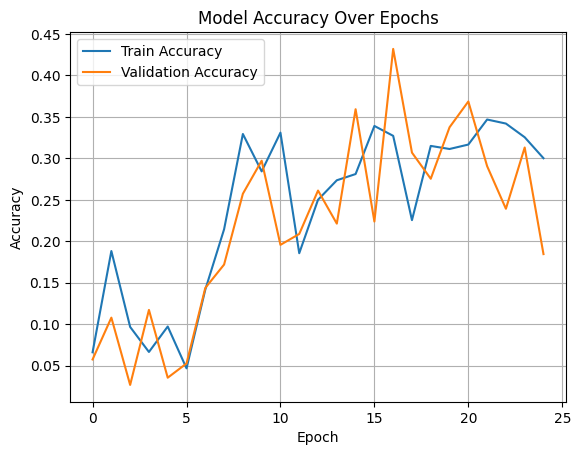

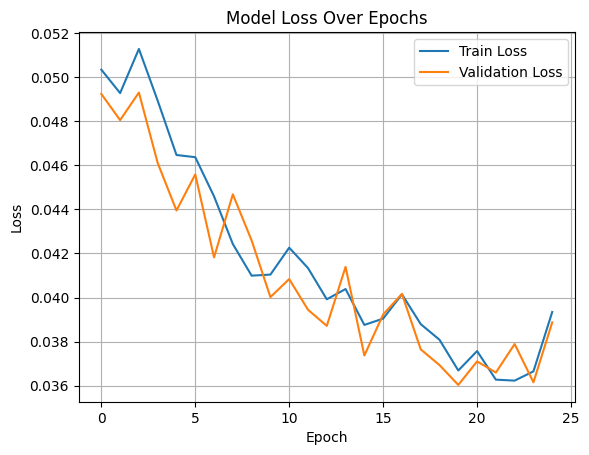

In [ ]:
evaluate_loss(unet_model4, test_images, test_masks)

The model accuracy is continuseing to improve per epoch and has not plateued. This suggests we can increase the number of epochs further.

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 780ms/step


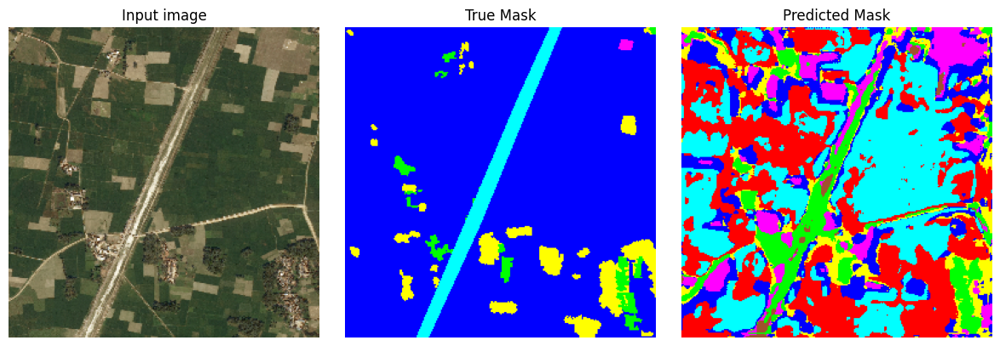

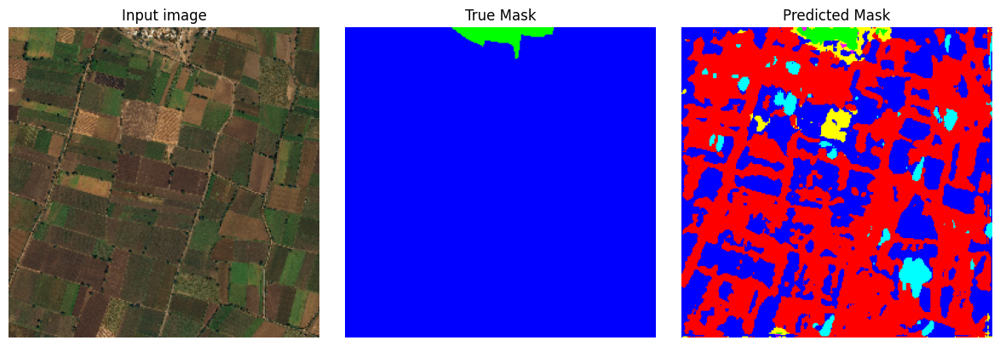

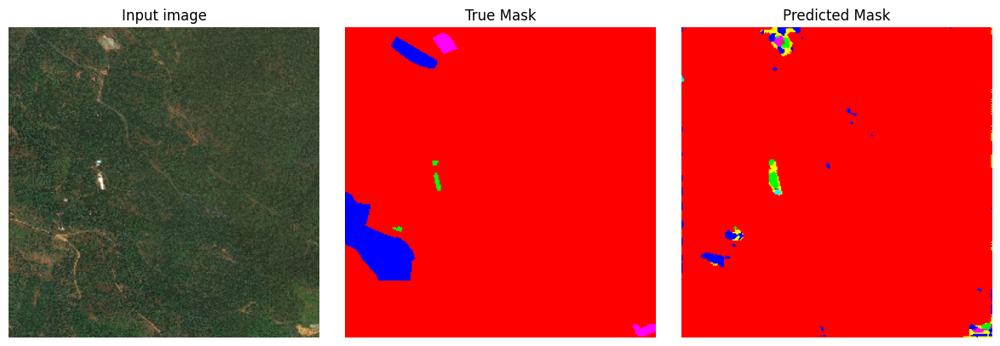

In [ ]:
pred_probs = unet_model4.predict(test_images)
pred_classes = np.argmax(pred_probs, axis=-1)
show_predictions(test_images, test_masks, pred_classes, class_colours, n=3)

In [ ]:
ious, mean_iou = compute_iou(test_masks, pred_classes)

print(f"mean iou: {mean_iou:.4f}")
for i, score in enumerate(ious):
    print(f"class {i} iou: {score:.4f}")

mean iou: 0.2280
class 0 iou: 0.4521
class 1 iou: 0.3426
class 2 iou: 0.1055
class 3 iou: 0.3916
class 4 iou: 0.1928
class 5 iou: 0.1072
class 6 iou: 0.0043


The overall aim for the iou is to be at least 0.5, so an average of 0.18 shows the model is not prediciting classes well.
The iou for classes 0 and 1 are not bad, the model is starting to learn these classes well, it is also starting to improve recognition for classes 3 and 4. The model is poor at recognising classes 2 and 5, and is not learning class 6 at all. This is due to class 6 (unkown) still being underrepresented in the dataset, with classes 0 and 1 ( urban and agriculture) the most common classes in the images, so the model is learning well.

In [ ]:
unet_model5 = build_unet_model4(input_shape=(256, 256, 3), num_classes=7)
unet_model5.compile(
    optimizer='adam',
    loss=loss_fn,  # your weighted loss
    metrics=['accuracy']
)

history = unet_model5.fit(train_dataset,validation_data=val_dataset,epochs=200,)

Epoch 1/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 18s 102ms/step - accuracy: 0.0986 - loss: 0.0462 - val_accuracy: 0.0833 - val_loss: 0.0493
Epoch 2/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.1360 - loss: 0.0497 - val_accuracy: 0.1179 - val_loss: 0.0490
Epoch 3/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.2180 - loss: 0.0450 - val_accuracy: 0.0269 - val_loss: 0.0492
Epoch 4/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - accuracy: 0.0735 - loss: 0.0483 - val_accuracy: 0.5768 - val_loss: 0.0491
Epoch 5/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.4098 - loss: 0.0457 - val_accuracy: 0.0267 - val_loss: 0.0492
Epoch 6/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.1430 - loss: 0.0460 - val_accuracy: 0.0258 - val_loss: 0.0482
Epoch 7/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.0660 - loss: 0.0458 - val_accuracy: 0.1236 - val_loss: 0.0453
Epoch 8/200
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - accuracy: 0.1022 - loss: 0.0447 - val_accuracy: 

In [ ]:
#unet_model5.save("/content/drive/MyDrive/unet_model4_100epoch.keras")
#unet_model5 = load_model("/content/drive/MyDrive/unet_model4_100epoch.keras")

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 658ms/step - accuracy: 0.4451 - loss: 0.0299
Test Loss: 0.0297
Test Accuracy: 0.4429


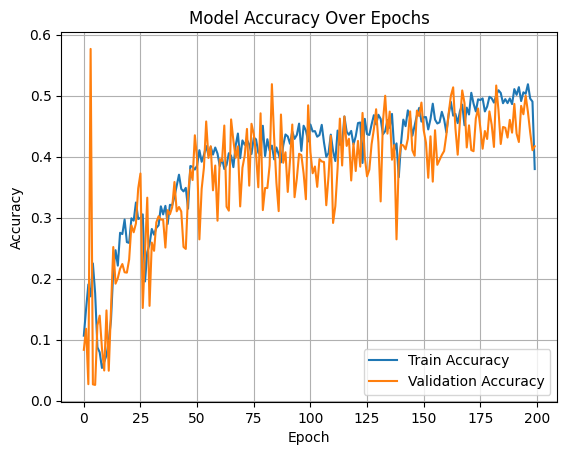

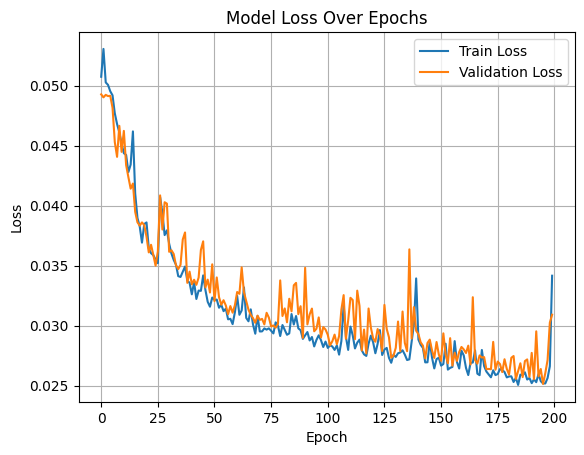

In [ ]:
evaluate_loss(unet_model5, test_images, test_masks)

The accuracy has platueued suggesting the model is fully trained

2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 782ms/step


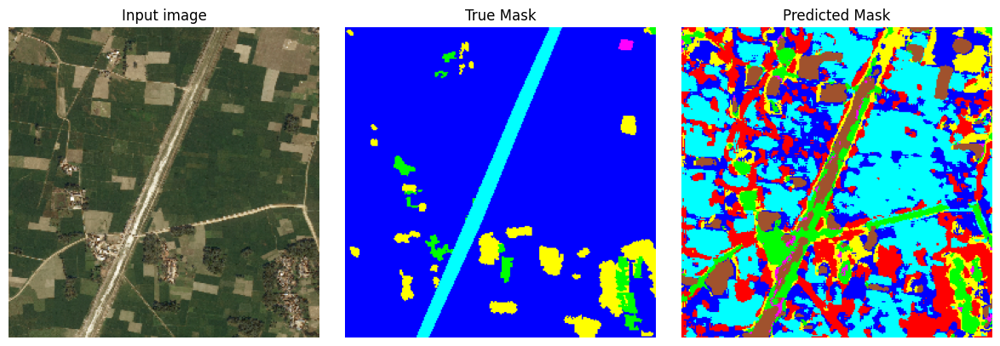

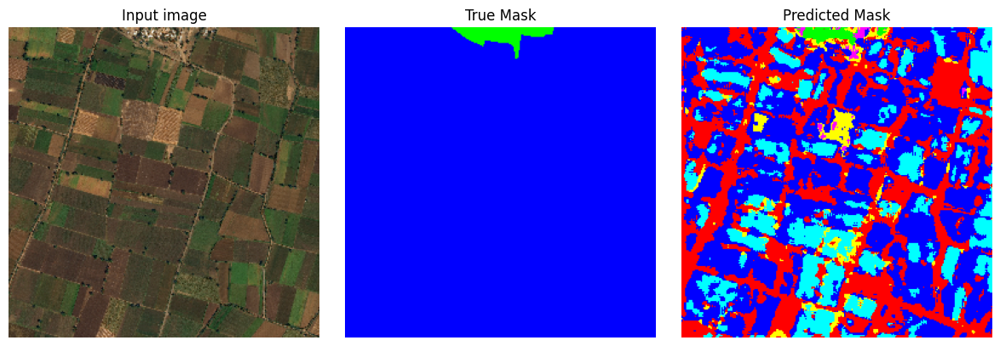

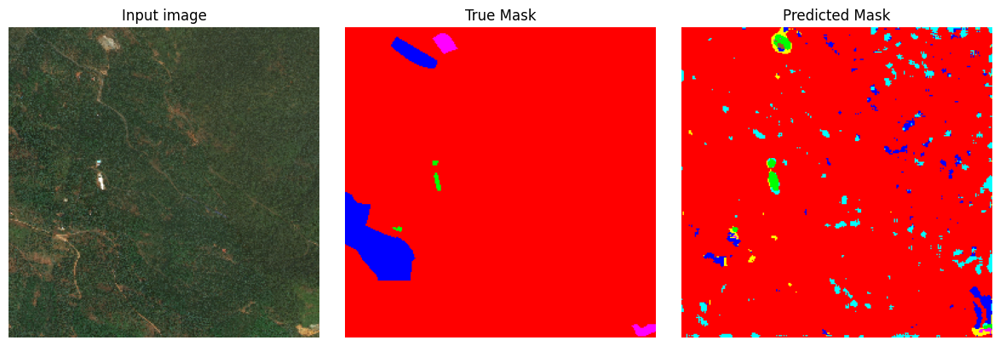

In [ ]:
pred_probs = unet_model5.predict(test_images)
pred_classes = np.argmax(pred_probs, axis=-1)
show_predictions(test_images, test_masks, pred_classes, class_colours, n=3)

The predicted masks are getting the shape and locations of the different classes generally correct, however with lots of noise around them. The model is being too over precise eg. image 3 in the bottom right it is identtifying the patch of grass in the forest as a separate class, whereas the mask does not. This is reducing the accuracy.

In [ ]:
ious, mean_iou = compute_iou(test_masks, pred_classes)

print(f"mean iou: {mean_iou:.4f}")
for i, score in enumerate(ious):
    print(f"class {i} iou: {score:.4f}")

mean iou: 0.2185
class 0 iou: 0.4346
class 1 iou: 0.3757
class 2 iou: 0.1262
class 3 iou: 0.3326
class 4 iou: 0.1121
class 5 iou: 0.1460
class 6 iou: 0.0021


This has greatly improved the iou, with 3 of the classes (notably class 3 - forest) being above the 0.5 benchmark. This means the model has learned these images well. The iou scores have increased in every class (exept for class 4 0.21->0.17) which is encouraging for increasing the number of epochs.

## Task 2: Revisited

We can use the U-Net models to compute class fractions more accurately than the CNNs. This can be done easily by calcaualting what percentage of pixels in the mask belongs to each class.

In [ ]:
def get_class_fractions(pred_masks, num_classes=7):
  """
  computes the fraction of each class in the predicted masks
  input: pred_masks, num_classes
  output: class_fractions, dictionary mapping class index to fraction

  """

  flat = pred_masks.flatten()
  total_pixels = flat.size
  class_fractions = {}

  for c in range(num_classes):
    class_count = np.sum(flat == c)
    class_fraction = (class_count / total_pixels) * 100
    class_fractions[c] = class_fraction

  return class_fractions


In [ ]:
def compare_class_fractions(true_masks, pred_masks, num_classes=7):
  """
  compares true vs predicted class percentages for each image

  plots bar charts of the class fractions for each image
  input: true_masks, pred_masks, num_classes
  output: None
  """
  N = true_masks.shape[0]

  for i in range(N):
    true = true_masks[i]
    pred = pred_masks[i]

    #compute class fractions
    true_frac = [(true == c).sum() / true.size * 100 for c in range(num_classes)]
    pred_frac = [(pred == c).sum() / pred.size * 100 for c in range(num_classes)]

    #plotting
    x = np.arange(num_classes)
    width = 0.35

    plt.figure(figsize=(8, 4))
    plt.bar(x - width/2, true_frac, width, label='True', color='green')
    plt.bar(x + width/2, pred_frac, width, label='Predicted', color='orange')

    plt.xlabel("Class")
    plt.ylabel("Pixel Percentage")
    plt.title(f"Image {i}: Class Distribution")
    plt.xticks(x, [f"Class {c}" for c in range(num_classes)])
    plt.ylim(0, 100)
    plt.legend()
    plt.tight_layout()
    plt.show()

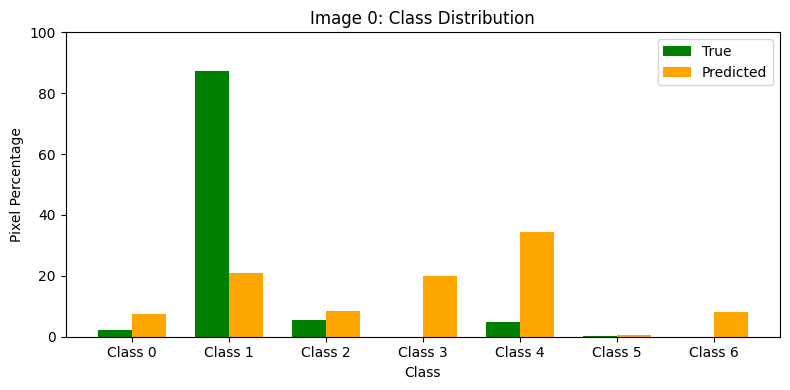

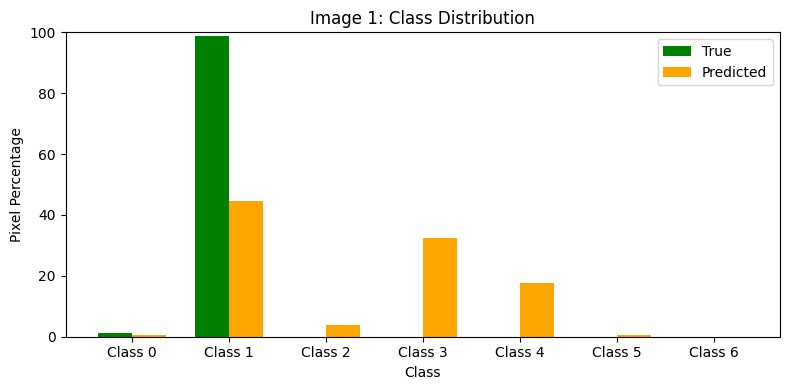

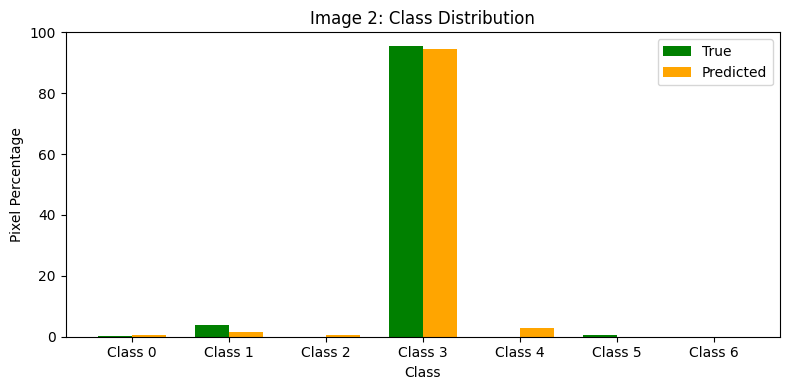

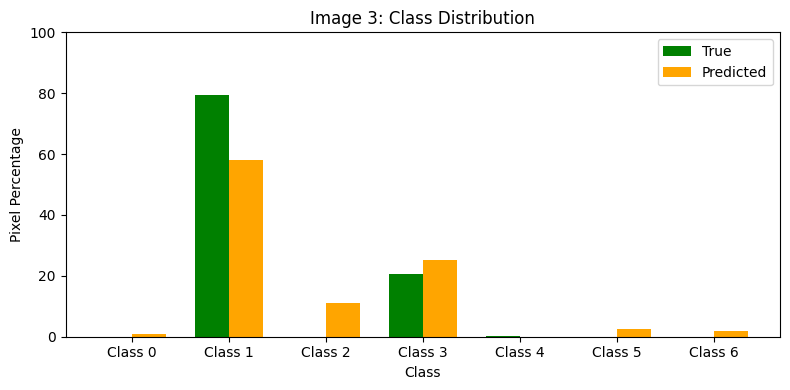

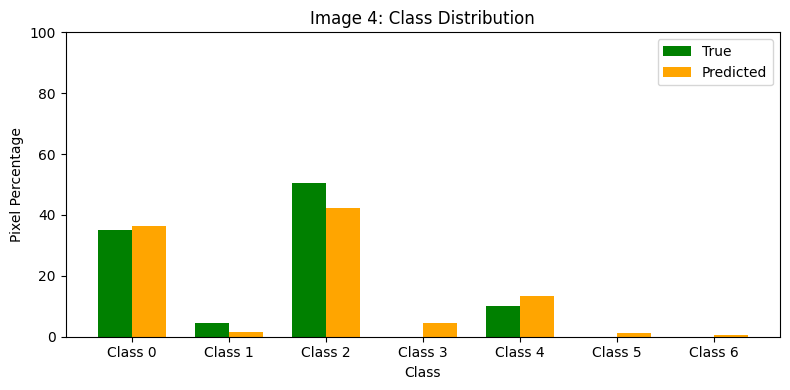

...

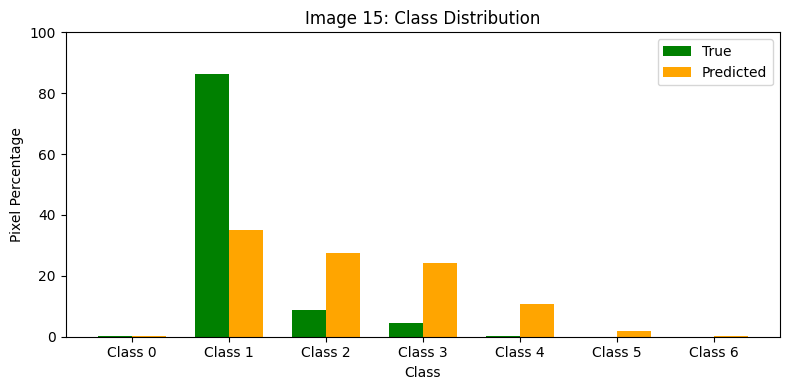

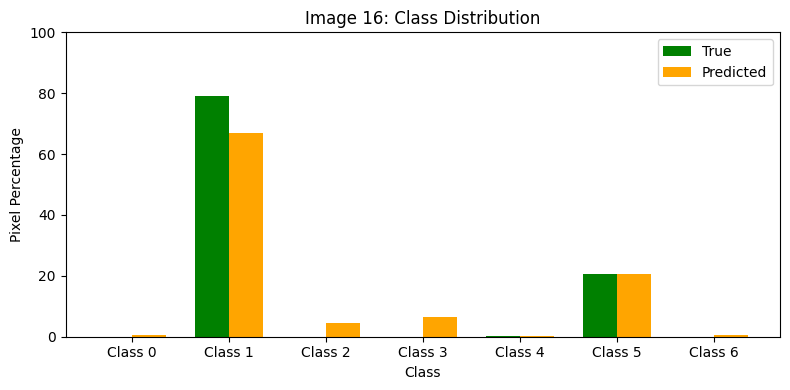

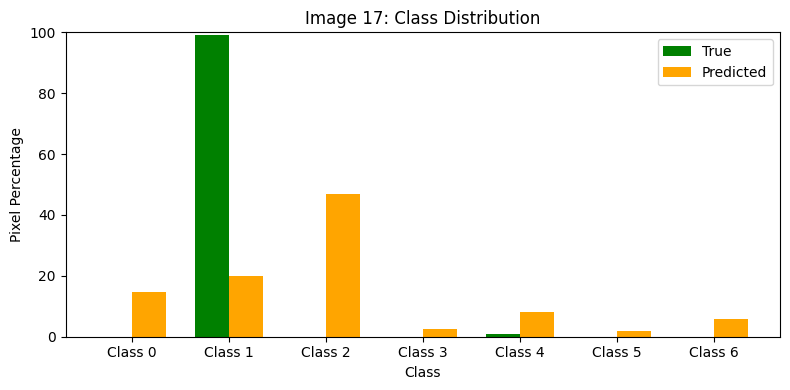

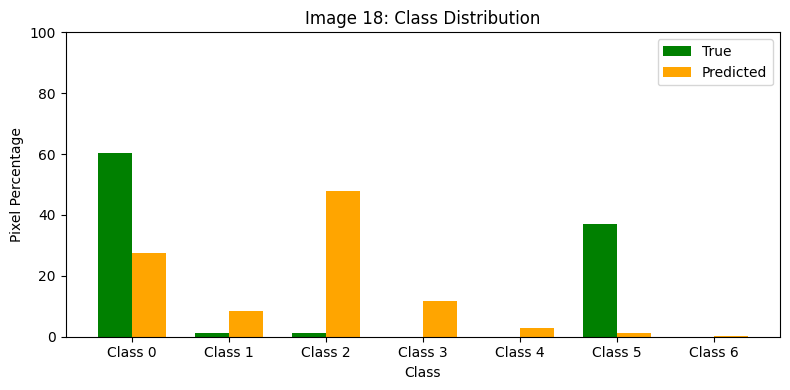

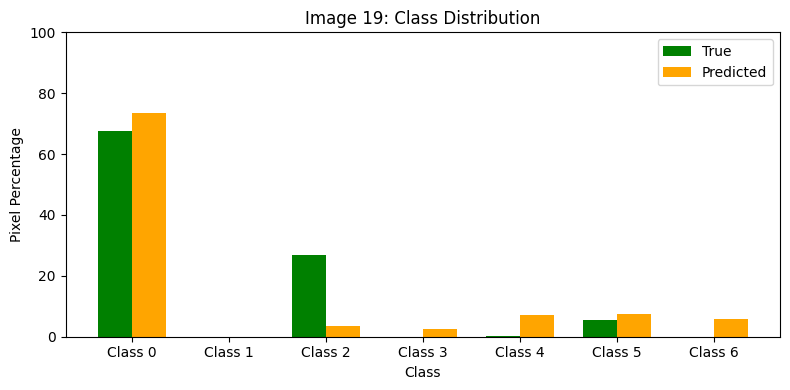

In [ ]:
compare_class_fractions(test_masks[:20], pred_classes[:20], num_classes=7)

# Extension: adding blur and clouds to the images.

If the models were working properly, i would run these funtions then comapre the class accuracies when blur is applied, and with clouds.

I would expect for blur the more easlily identifiable classes such as urban and agriculture will be unaffected, but terrain like forest that requires more texture will reduce in acccuracy, or finer features like rivers will be lost by the blur and water accuracy will deacrease.

For clouds, only the terrain covered will be lost. The model will lose some whole image broader context if some patterns are interrupted by cloud, but this should be negligable.

In [ ]:
def apply_blur(image, kernel_size=(5, 5)):
    """
    applies gaussian blur to an image
    input: image, kernel_size
    output: blurred image
    """
    image_blur = cv2.GaussianBlur((image * 255).astype(np.uint8), kernel_size, 0)
    return image_blur.astype(np.float32) / 255.0  # normalize back to 0–1

In [ ]:
def add_clouds(image, cloud_fraction=0.1):
    """
    randomly masks out a rectangular region simulating cloud cover
    input: image, cloud_fraction
    output: image_clouded, image with cloud cover
    """
    h, w, _ = image.shape
    cloud_area = int(h * w * cloud_fraction)

    #randomly select top left corner of a cloud rectangle
    cloud_h = int(np.sqrt(cloud_area))
    cloud_w = cloud_h

    x = np.random.randint(0, w - cloud_w)
    y = np.random.randint(0, h - cloud_h)

    image_clouded = image.copy()
    image_clouded[y:y+cloud_h, x:x+cloud_w] = 1.0  # white cloud


    return image_clouded